Temperature Forecast Project using ML

Problem Statement:

Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the
LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer
data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum 
and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum 
and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.



DESCRIPTION

Lapse rate, rate of change in temperature observed while moving upward through the Earth’s atmosphere. The lapse rate is considered positive when the temperature decreases with elevation, zero when the temperature is constant with elevation, and negative when the temperature increases with elevation ( temperature inversion ).

In meteorology, latent heat flux is the flux of heat from the Earth's surface to the atmosphere that is associated with evaporation or transpiration of water at the surface and subsequent condensation of water vapor in the troposphere.

Cloud cover (also known as cloudiness, cloudage, or cloud amount) refers to the fraction of the sky obscured by clouds when observed from a particular location. Okta is the usual unit of measurement of the cloud cover. The cloud cover is correlated to the sunshine duration as the least cloudy locales are the sunniest ones while the cloudiest areas are the least sunny places.


In meteorology, precipitation is any product of the condensation of atmospheric water vapor that falls under gravitational pull from clouds. The main forms of precipitation include drizzling, rain, sleet, snow, ice pellets, graupel and hail. Precipitation occurs when a portion of the atmosphere becomes saturated with water vapor (reaching 100% relative humidity), so that the water condenses and "precipitates" or falls.

A digital elevation model (DEM) is a 3D computer graphics representation of elevation data to represent terrain, commonly of a planet, moon, or asteroid. A "global DEM" refers to a discrete global grid. DEMs are used often in geographic information systems, and are the most common basis for digitally produced relief maps.

Slope is a measure of change in elevation

Detailed Attribute Information

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

Prediction : Make two prediction 1) Next_Tmax: Next day maximum temperature 2) Next_Tmin: Next day  minimum temperature



In [1]:
#import all libaries
import pandas as pd
import statistics
import seaborn as sns
from matplotlib import pyplot as plt
import sklearn
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
url="https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv"



In [2]:
#stroing into csv file
df = pd.read_csv(url)
df.to_csv("Temperature_Forecast_.csv",sep='\t')

In [3]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1, LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation are the columns which has continous values.	
Date is the column which has date type values.
Next_Tmax, Next_Tmin are the Target columns which has continous values.We are going to predict these two columns.Since it has continous values hence it is a Regression problem.


In [4]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

PREDICTION FOR NEXT DAY MAX TEMPERATURE

In [5]:
df.shape

(7752, 25)

EDA:

In [6]:
#checks nulls values of columns if present any
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [8]:
df.apply(lambda x: len(x.unique())) # getting unique values of all the columns

station               26
Date                 311
Present_Tmax         168
Present_Tmin         156
LDAPS_RHmin         7673
LDAPS_RHmax         7665
LDAPS_Tmax_lapse    7676
LDAPS_Tmin_lapse    7676
LDAPS_WS            7676
LDAPS_LH            7676
LDAPS_CC1           7570
LDAPS_CC2           7583
LDAPS_CC3           7600
LDAPS_CC4           7525
LDAPS_PPT1          2813
LDAPS_PPT2          2511
LDAPS_PPT3          2357
LDAPS_PPT4          1919
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            184
Next_Tmin            158
dtype: int64

EDA

In [9]:
# replace empty values of the columns by mean,most frequent values
import numpy as np
from sklearn.impute import SimpleImputer
for col in ['Present_Tmax', 'Present_Tmin','LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','Next_Tmax', 'Next_Tmin']:
    imp=SimpleImputer(missing_values=np.NaN,strategy="mean")
    df[col]=imp.fit_transform(df[col].values.reshape(-1,1))

In [10]:
for col in ['station','Date','LDAPS_RHmin','LDAPS_RHmax']:
    imp=SimpleImputer(missing_values=np.NaN,strategy="most_frequent")
    df[col]=imp.fit_transform(df[col].values.reshape(-1,1))

In [11]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

create year and month column for analysis purpose only

In [12]:
import calendar
  
df['Date'] = pd.to_datetime(df['Date'], errors = 'coerce')

# extracting year and month from date
df['month'] = df['Date'].dt.month
df['month']=df['month'].apply(lambda x: calendar.month_abbr[x])




In [13]:
df['year'] = pd.DatetimeIndex(df['Date']).year

In [14]:
df = df.set_index('Date')

In [15]:
data_cols = ['Present_Tmax','Present_Tmin','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse']
df_monthly_mean = df[data_cols].resample('MS').mean()
df_monthly_mean

,Present_Tmax,Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse
Date,,,,
2013-01-01,31.265385,23.501923,28.159237,23.985057
2013-02-01,28.402000,23.798000,29.371506,23.594070
2013-03-01,31.021364,23.184501,30.783250,24.378774
2013-04-01,29.451364,24.604501,31.391292,24.946770
2013-05-01,29.877364,23.766501,30.618672,24.099570
2013-06-01,29.832909,22.417667,30.400525,23.928808
2013-07-01,28.616580,23.708334,29.098302,24.406834
2013-08-01,31.100873,24.300700,30.715042,24.684967
2013-09-01,29.033364,25.500501,31.401742,24.595596


this gives temperature values for all months

In [16]:
df1 = df_monthly_mean[df_monthly_mean.index.month==5]
print(df1)


            Present_Tmax  Present_Tmin  LDAPS_Tmax_lapse  LDAPS_Tmin_lapse
Date                                                                      
2013-05-01     29.877364     23.766501         30.618672         24.099570
2014-05-01     29.062000     23.386000         28.473899         23.452816
2015-05-01     30.452000     22.808000         31.709128         22.883725
2016-05-01     30.490000     23.344000         29.754136         23.431369
2017-05-01     33.690728     24.973002         33.507170         26.218103


this gives 4th month temperature values.here month is taken randomnly

In [17]:
df_Next_Tmax=df.groupby(['station','Next_Tmax']).size().sort_values(0, ascending=False).reset_index()
df_Next_Tmax

,station,Next_Tmax,0
0,8.0,30.500000,10
1,9.0,32.500000,10
2,17.0,31.000000,10
3,16.0,29.300000,10
4,13.0,29.300000,9
...,...,...,...
2816,10.0,21.900000,1
2817,10.0,20.300000,1
2818,9.0,36.500000,1
2819,19.0,30.274887,1


the highest maximum temperature is in 27th station

In [18]:
df_Next_Tmin=df.groupby(['station','Next_Tmin']).size().sort_values(0, ascending=True).reset_index()
df_Next_Tmin

,station,Next_Tmin,0
0,1.0,11.3,1
1,13.0,16.7,1
2,13.0,17.0,1
3,13.0,17.4,1
4,13.0,17.7,1
...,...,...,...
2327,24.0,24.0,14
2328,15.0,23.4,14
2329,5.0,23.5,14
2330,14.0,23.4,15


the next day minimum temperatue is in station 1

In [19]:
df_Next_Tmin=df.groupby(['month','Next_Tmin']).size().sort_values(0, ascending=True).reset_index()
df_Next_Tmin

,month,Next_Tmin,0
0,Apr,16.0,1
1,Jun,19.1,1
2,Jun,19.0,1
3,Jun,18.8,1
4,Jun,18.7,1
...,...,...,...
1151,Jul,23.9,68
1152,Jul,23.5,70
1153,Jul,24.0,70
1154,Jul,23.2,75


the next day minimum temperature is in april month

In [20]:
df_Next_Tmax=df.groupby(['month','Next_Tmax']).size().sort_values(0, ascending=False).reset_index()
df_Next_Tmax

,month,Next_Tmax,0
0,Jul,31.2,46
1,Jul,29.3,46
2,Jul,31.6,45
3,Jul,32.5,44
4,Jul,31.3,42
...,...,...,...
1309,Jan,24.1,1
1310,Jan,24.8,1
1311,May,33.5,1
1312,May,33.4,1


the next day maximum temperature is in july month

In [21]:
df_Next_Tmin=df.groupby(['year','Next_Tmin']).size().sort_values(0, ascending=True).reset_index()
df_Next_Tmin

,year,Next_Tmin,0
0,2013,11.3,1
1,2014,28.6,1
2,2014,28.8,1
3,2014,29.1,1
4,2014,29.4,1
...,...,...,...
612,2017,24.0,43
613,2017,23.5,44
614,2013,23.4,44
615,2013,23.2,45


the next day minimum temperature in overall is noted in 2013

In [22]:
df_Next_Tmax=df.groupby(['year','Next_Tmax']).size().sort_values(0, ascending=False).reset_index()
df_Next_Tmax

,year,Next_Tmax,0
0,2015,29.3,33
1,2014,29.6,33
2,2014,29.8,33
3,2013,31.3,31
4,2015,31.2,31
...,...,...,...
725,2016,21.4,1
726,2016,21.5,1
727,2016,22.4,1
728,2016,22.6,1


the next day maximum temperature in overall is noted in 2017

In [23]:
#Looking at below claim_amount:
a_claims=pd.pivot_table(df,values='Next_Tmin',index=['month','year','station']).sort_values('Next_Tmin',ascending=False)

cm=sns.light_palette("black", as_cmap=True)
a_claims.style.background_gradient(cmap=cm)

this shows year,month,station wise next day minimum temperature

In [24]:
#Looking at below claim_amount:
a_claims=pd.pivot_table(df,values='Next_Tmax',index=['month','year','station']).sort_values('Next_Tmax',ascending=False)

cm=sns.light_palette("black", as_cmap=True)
a_claims.style.background_gradient(cmap=cm)

this shows year,month,station wise next day maximum temperature

In [25]:
df[['month','Next_Tmin']].groupby(['month'], 
                as_index = True).mean().sort_values(by = 'Next_Tmin', ascending = True)

,Next_Tmin
month,
Aug,22.202795
Jun,22.662219
Feb,22.764258
May,22.765329
Mar,23.047329
Jan,23.069841
Dec,23.125200
Oct,23.204129
Sep,23.326658


the next day minimum temperature is noted in august in overall

In [26]:
df[['month','Next_Tmax']].groupby(['month'], 
                as_index = False).mean().sort_values(by = 'Next_Tmax', ascending = False)

,month,Next_Tmax
10,Oct,32.170700
0,Apr,31.306800
8,May,30.995900
7,Mar,30.856700
6,Jun,30.819666
9,Nov,30.718199
5,Jul,30.286619
11,Sep,30.184999
4,Jan,30.116270
3,Feb,29.986999


the next day maximum teperature is noted in october in overall

In [27]:
df[['year','Next_Tmin']].groupby(['year'], 
                as_index = False).mean().sort_values(by = 'Next_Tmin', ascending = True)

,year,Next_Tmin
1,2014,21.963376
2,2015,22.359263
4,2017,23.141282
3,2016,23.495869
0,2013,23.700320


next day minimum temp is noted in 2014 in overall

In [28]:
df[['year','Next_Tmax']].groupby(['year'], 
                as_index = False).mean().sort_values(by = 'Next_Tmax', ascending = False)

,year,Next_Tmax
3,2016,31.251177
2,2015,30.365741
0,2013,30.150209
4,2017,29.995548
1,2014,29.611919


next day maximum temp is noted in 2016 in overall

In [29]:
df[['station','Next_Tmin']].groupby(['station'], 
                as_index = False).mean().sort_values(by = 'Next_Tmin', ascending = True)

,station,Next_Tmin
0,1.0,20.891667
16,17.0,21.284516
9,10.0,21.670000
15,16.0,21.808814
1,2.0,21.873548
11,12.0,21.946878
18,19.0,22.362685
19,20.0,22.725588
4,5.0,22.767616
8,9.0,22.850645


In [30]:
df[['station','Next_Tmax']].groupby(['station'], 
                as_index = False).mean().sort_values(by = 'Next_Tmax', ascending = False)

,station,Next_Tmax
17,18.0,31.693871
22,23.0,31.087742
24,25.0,30.935161
23,24.0,30.875403
21,22.0,30.873386
3,4.0,30.688065
12,13.0,30.672581
10,11.0,30.635322
5,6.0,30.625160
13,14.0,30.452581


In [31]:
coll_df=df[['Next_Tmax','month']]
res_df=coll_df.loc[coll_df['month']=='Apr']
res_df['Next_Tmax'].value_counts()

29.6    9
30.0    9
30.7    7
29.8    7
29.7    6
       ..
31.3    1
35.1    1
37.4    1
25.7    1
31.9    1
Name: Next_Tmax, Length: 99, dtype: int64

this shows april months next day max temp values

In [32]:
coll_df=df[['Next_Tmin','month']]
res_df=coll_df.loc[coll_df['month']=='Apr']
res_df['Next_Tmin'].value_counts()

24.0    7
23.9    6
26.5    5
24.7    5
20.4    5
       ..
26.9    1
19.9    1
28.3    1
25.6    1
28.4    1
Name: Next_Tmin, Length: 96, dtype: int64

this shows april months next day max temp values

VISUALIZATION

In [33]:
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [34]:
px.scatter(df, 'month', 'Next_Tmin', size='Next_Tmin', animation_frame='year')

the next day minimum temperature is high in august

In [35]:
px.scatter(df, 'month', 'Next_Tmax', size='Next_Tmax', animation_frame='year')

july and august has next day maximum temperature high than other in overall

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

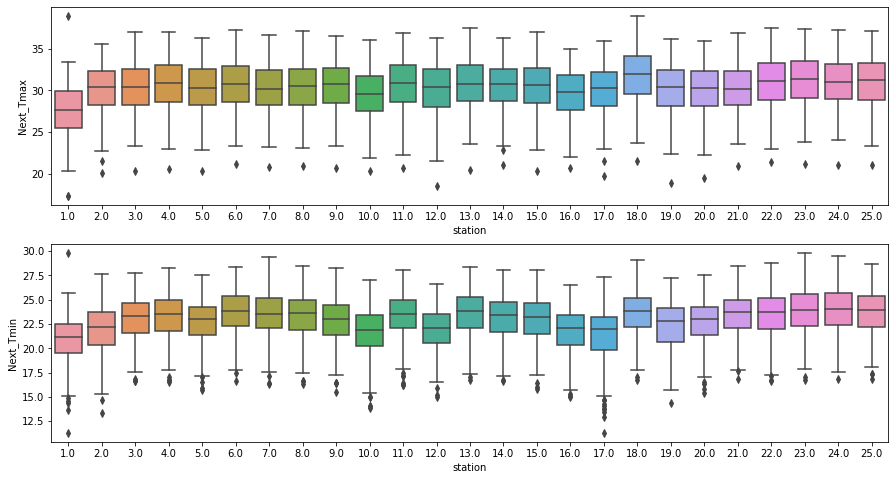

In [36]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='station',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='station',y='Next_Tmin',data=df)

this shows stationwise next day min and max temp details

<AxesSubplot:xlabel='month', ylabel='Next_Tmin'>

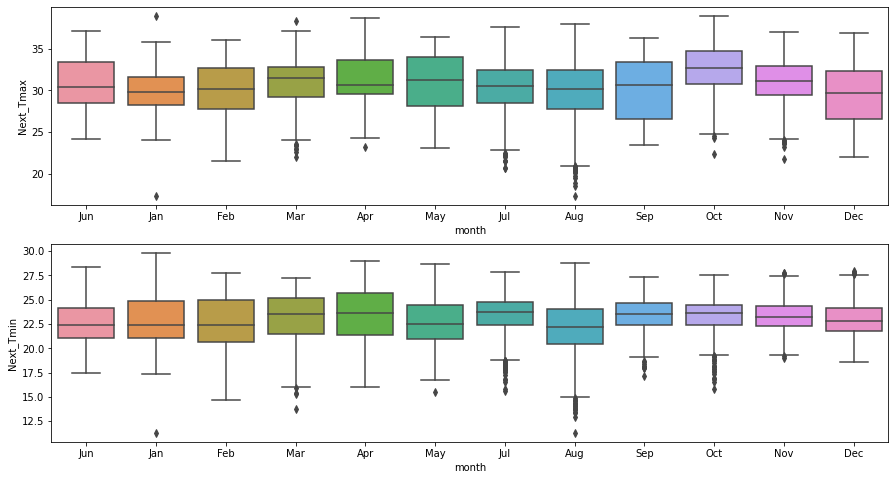

In [37]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='month',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='month',y='Next_Tmin',data=df)

this shows month wise next day min and max temp details

<AxesSubplot:xlabel='year', ylabel='Next_Tmin'>

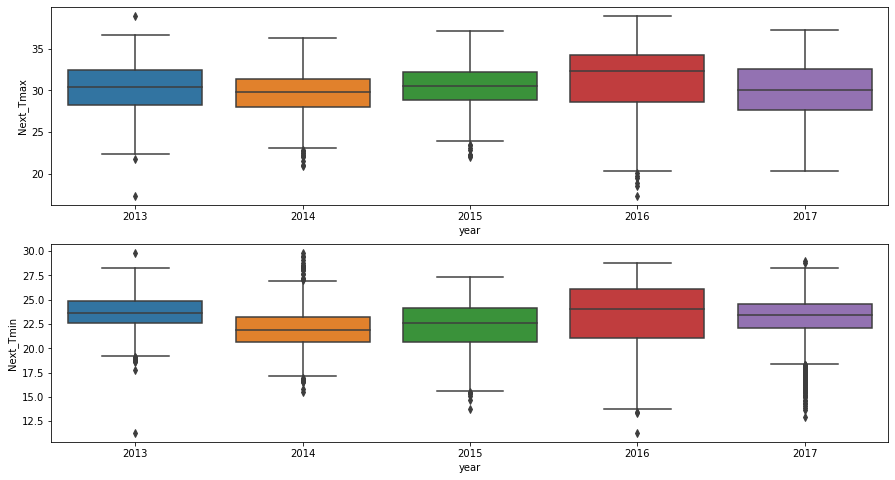

In [38]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='year',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='year',y='Next_Tmin',data=df)

this shows  year wise next day min and max temp details

<AxesSubplot:xlabel='lat', ylabel='Next_Tmin'>

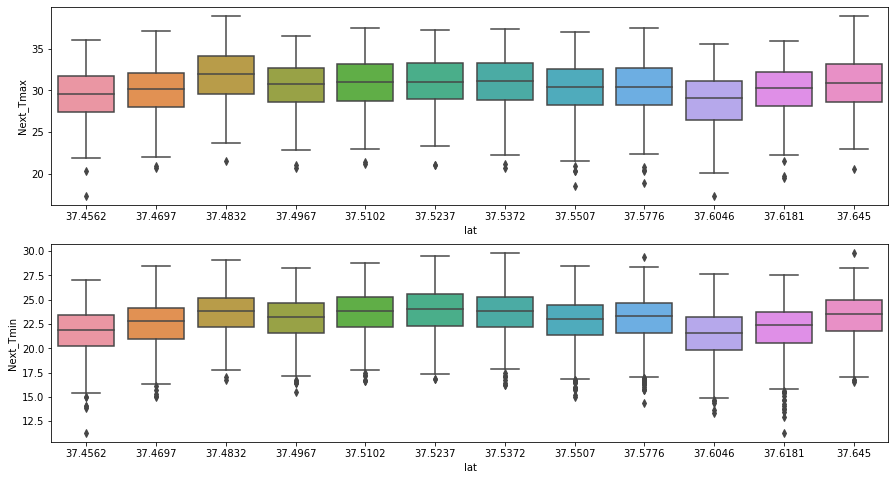

In [39]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='lat',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='lat',y='Next_Tmin',data=df)

this shows latitude wise next day min and max temp details

<AxesSubplot:xlabel='lon', ylabel='Next_Tmin'>

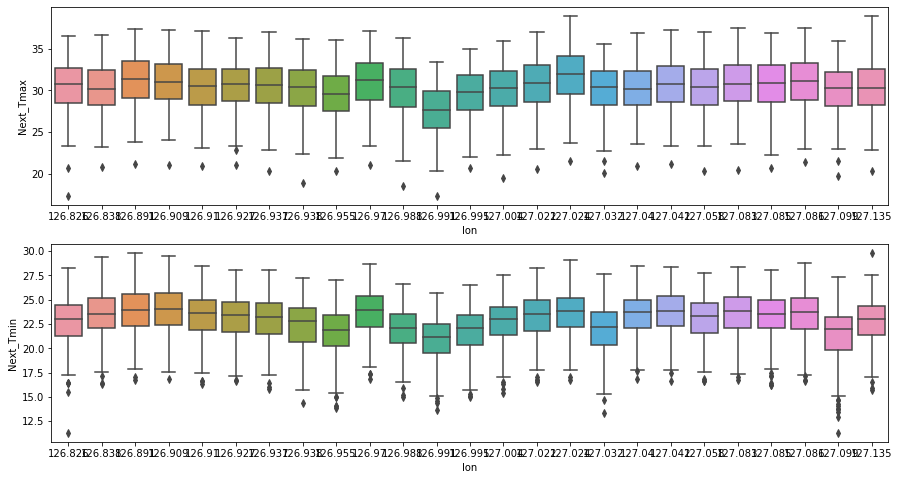

In [40]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='lon',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='lon',y='Next_Tmin',data=df)

this shows longitude wise next day min and max temp details

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmin'>

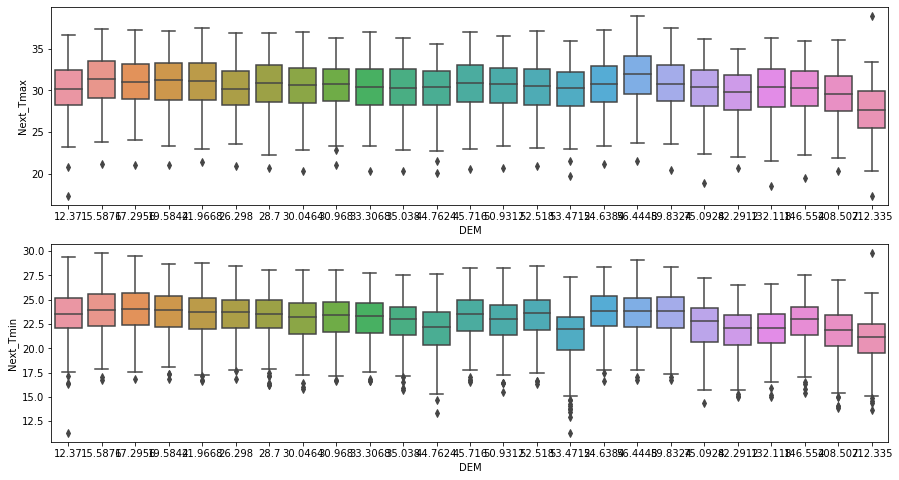

In [41]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='DEM',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='DEM',y='Next_Tmin',data=df)

this shows DEM wise next day min and max temp details

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmin'>

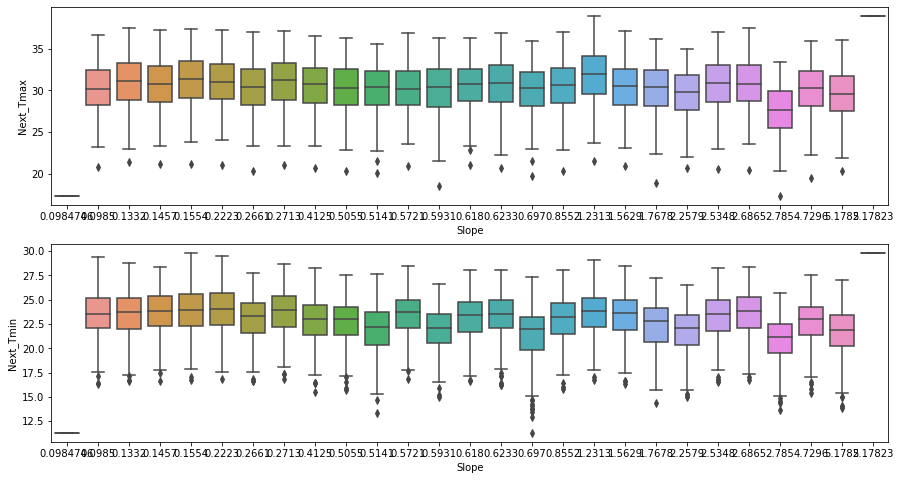

In [42]:
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(x='Slope',y='Next_Tmax',data=df)
plt.subplot(2,1,2)
sns.boxplot(x='Slope',y='Next_Tmin',data=df)

this shows slope wise next day min and max temp details

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

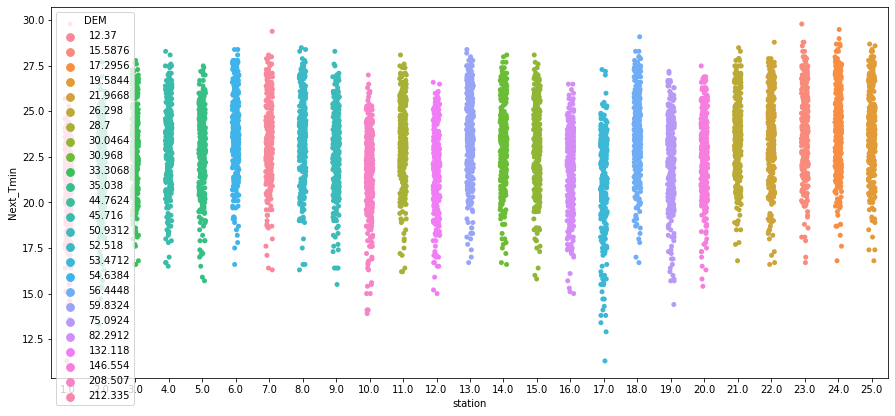

In [43]:
plt.figure(figsize=(15,15))
plt.subplot(2,1,2)
sns.stripplot(x='station',y='Next_Tmin',hue='DEM',data=df)

this shows station,DEM wise next day min and max temp details

In [44]:
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.style.use('dark_background')
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [45]:
fig = px.density_mapbox(df, lat='lat', lon='lon', z='Present_Tmin',  hover_data=['LDAPS_RHmin', 'LDAPS_RHmax'],
      mapbox_style="stamen-terrain", template = 'plotly_dark', title = 'Minimum Temperature on Lat Long')

fig.show()


In [46]:
fig = px.scatter_geo(df, lat='lat', lon='lon', color='Solar radiation', hover_data=['LDAPS_RHmin', 'LDAPS_RHmax'],animation_frame="month",
                        
                         template = 'plotly_dark', title = 'Solar Radiation on Lat Long')
fig.update_geos(
center=dict(lon=126.9780, lat=37.5665),
scope = 'asia'

)
fig.show()

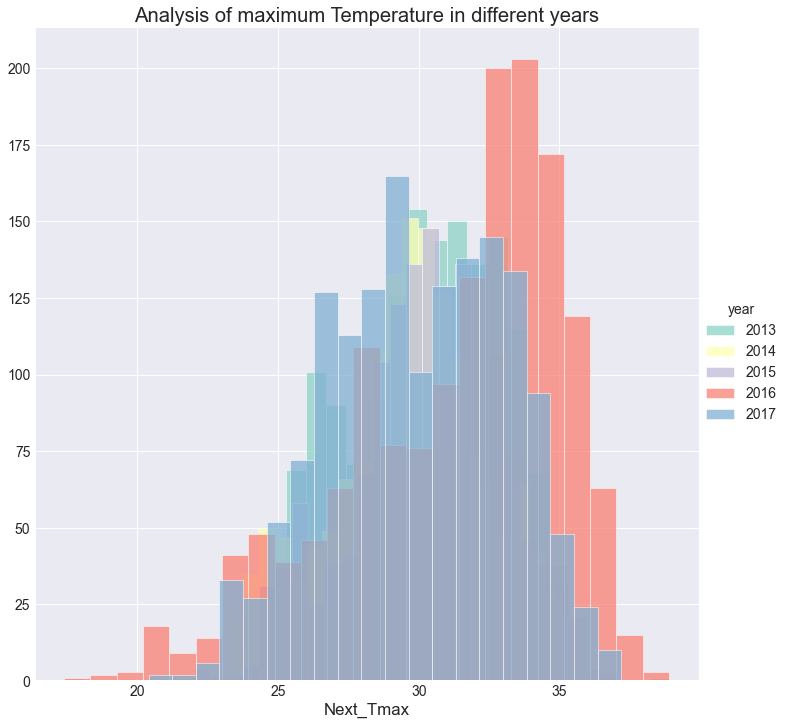

In [47]:
# For Apparent Temperature (C)
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="year", height=10).map(sns.histplot, "Next_Tmax").add_legend()
plt.title("Analysis of maximum Temperature in different years")
# save the figure
plt.savefig('plot4.png', dpi=300, bbox_inches='tight')
plt.show()


2016 has maximum temperatures of next day predicted in overall

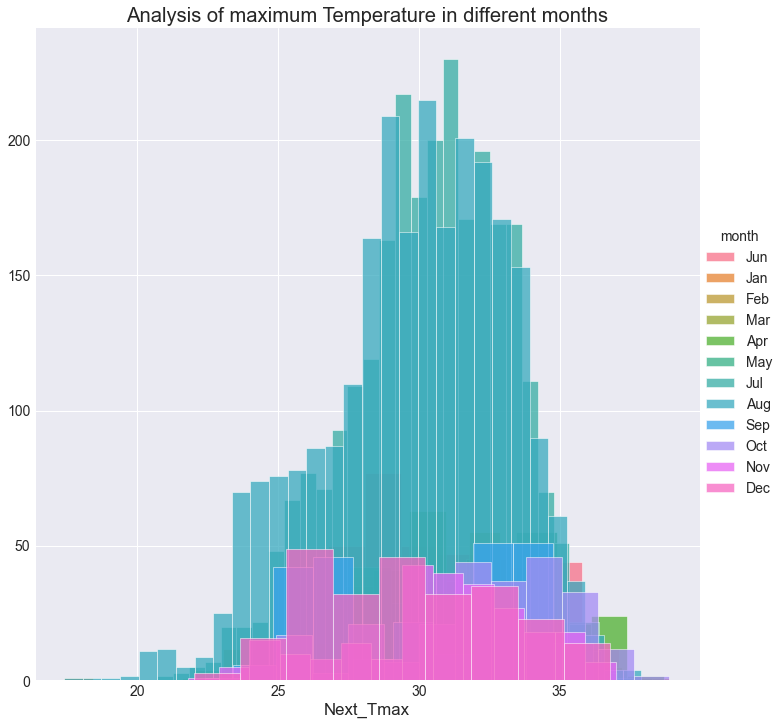

In [48]:
# For Apparent Temperature (C)
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="month", height=10).map(sns.histplot, "Next_Tmax").add_legend()
plt.title("Analysis of maximum Temperature in different months")
# save the figure
plt.savefig('plot4.png', dpi=300, bbox_inches='tight')
plt.show()


April has maximum temperatures of next day predicted in overall

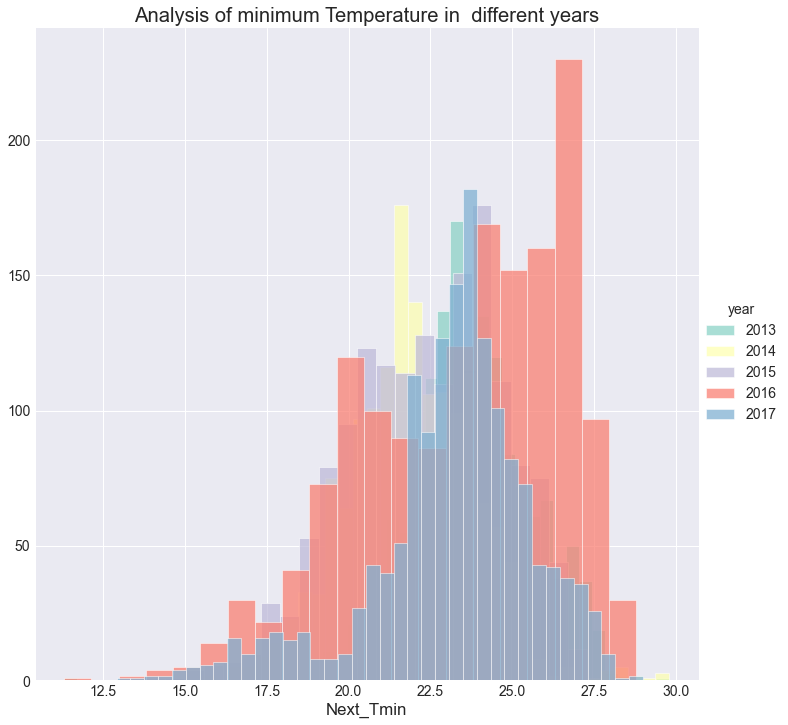

In [49]:
# For Apparent Temperature (C)
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="year", height=10).map(sns.histplot, "Next_Tmin").add_legend()
plt.title("Analysis of minimum Temperature in  different years")
# save the figure
plt.savefig('plot4.png', dpi=300, bbox_inches='tight')
plt.show()


2016 has minimum temperatures of next day predicted in overall

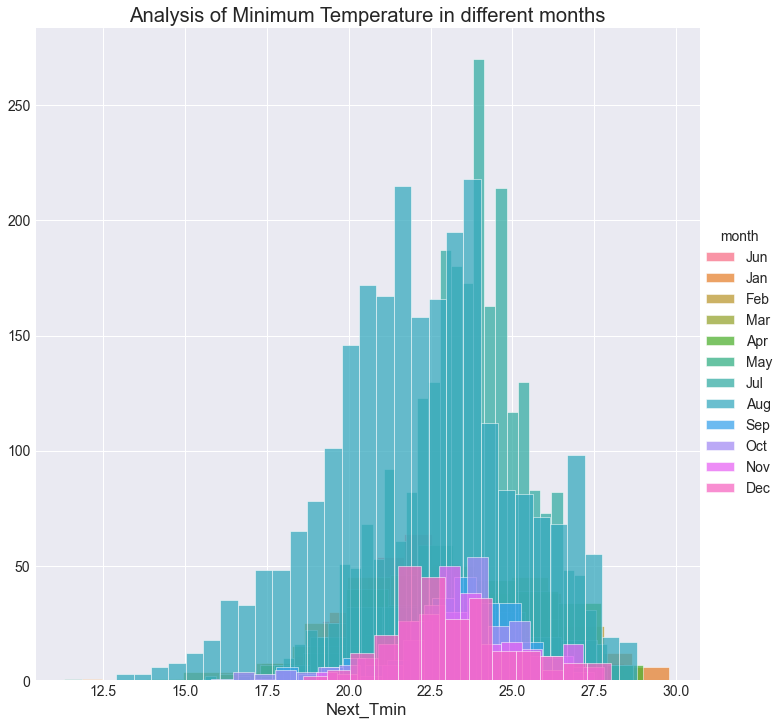

In [50]:
# For Apparent Temperature (C)
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="month", height=10).map(sns.histplot, "Next_Tmin").add_legend()
plt.title("Analysis of Minimum Temperature in different months")
# save the figure
plt.savefig('plot4.png', dpi=300, bbox_inches='tight')
plt.show()


August has minimum temperatures of next day predicted in overall

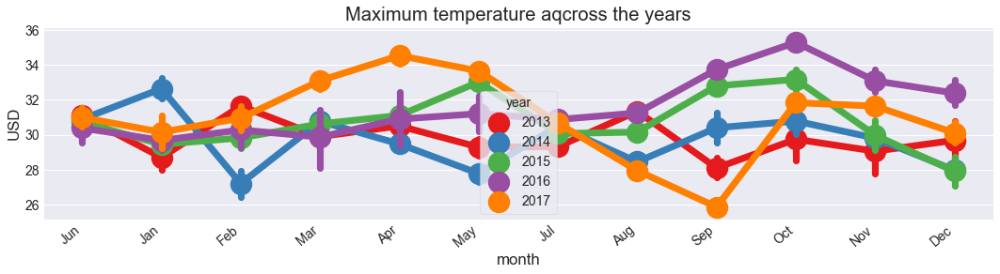

In [51]:
plt.figure(figsize=(15,4))
ax=sns.pointplot(x='month', y='Next_Tmax', data=df, hue='year', palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.title('Maximum temperature aqcross the years')
plt.ylabel('USD')
plt.show()


this shows year wise month wise maximum temp values

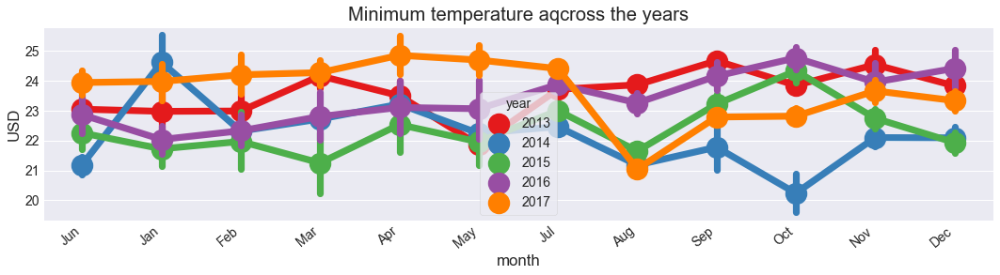

In [52]:
plt.figure(figsize=(15,4))
ax=sns.pointplot(x='month', y='Next_Tmin', data=df, hue='year', palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.title('Minimum temperature aqcross the years')
plt.ylabel('USD')
plt.show()


this shows year wise month wise minimum temp values

<AxesSubplot:xlabel='Next_Tmax', ylabel='month'>

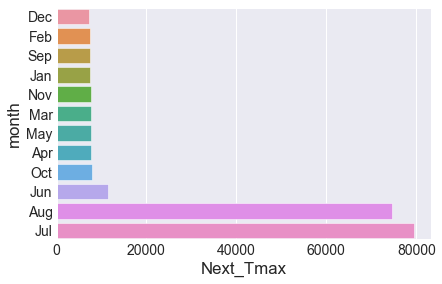

In [53]:
sns.barplot(x=df.groupby('month')['Next_Tmax'].sum().sort_values(), y=df.groupby('month')['Next_Tmax'].sum().sort_values().keys(), data=df)

july and august has next day maximum temperature in overall

<AxesSubplot:xlabel='year', ylabel='Next_Tmax'>

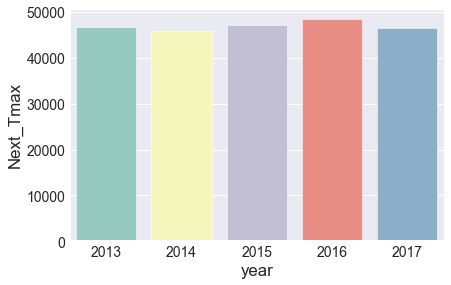

In [54]:
sns.barplot(y=df.groupby('year')['Next_Tmax'].sum().sort_values(), x=df.groupby('year')['Next_Tmax'].sum().sort_values().keys(), data=df)

2016 has next day maximum temperature in overall

In [55]:
df_scatter = df[['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3']]

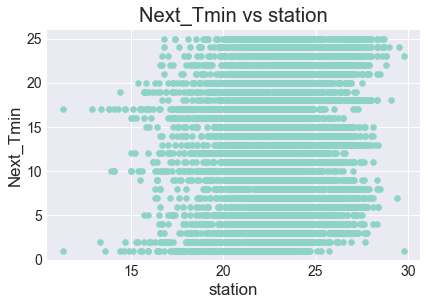

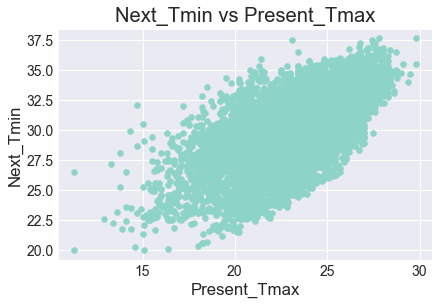

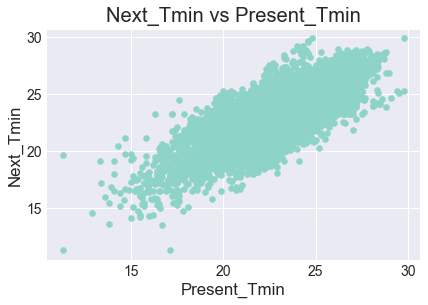

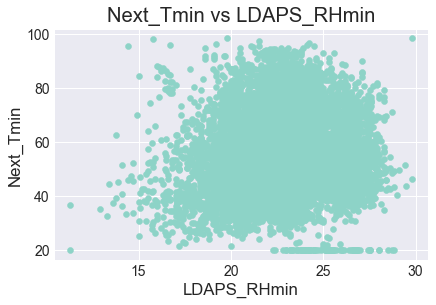

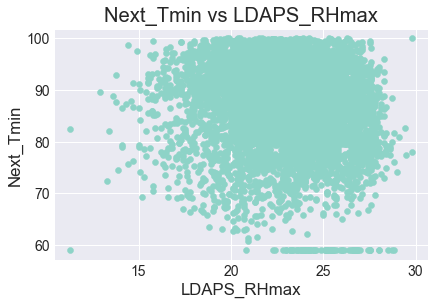

...

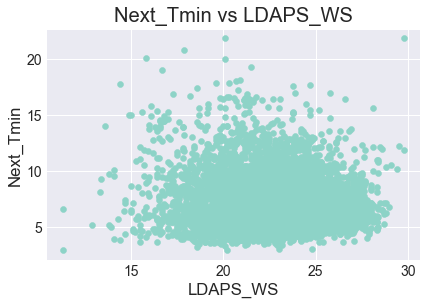

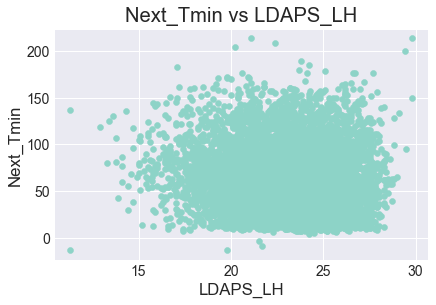

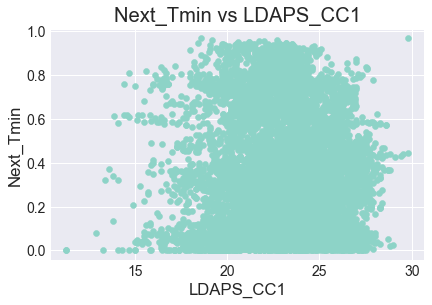

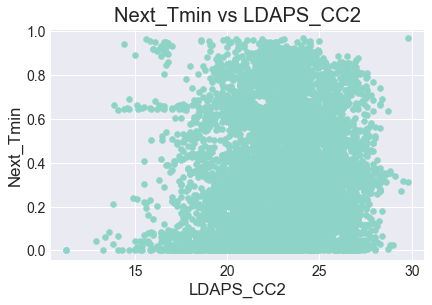

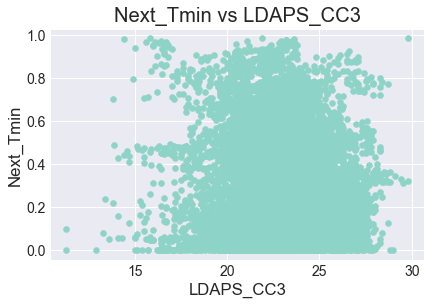

In [56]:
y_col = "Next_Tmin"

for x_col in df_scatter:

    figure = plt.figure
    ax = plt.gca()
    ax.scatter(df[y_col], df_scatter[x_col])
    ax.set_ylabel(y_col)
    ax.set_xlabel(x_col)
    ax.set_title("{} vs {}".format(y_col, x_col))

    
    plt.show()

if Present_Tmax, Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse increases the next day minimum temperature also increases

In [57]:
df_scatter1 = df[[ 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin']]

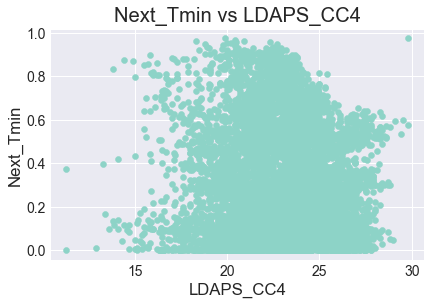

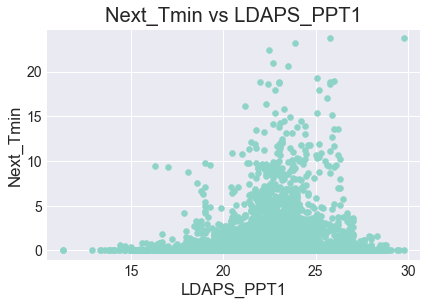

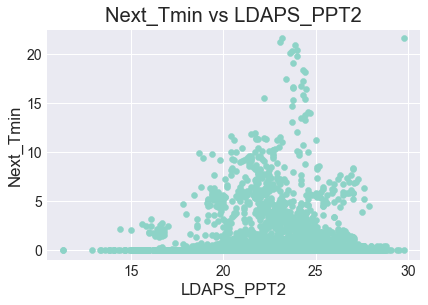

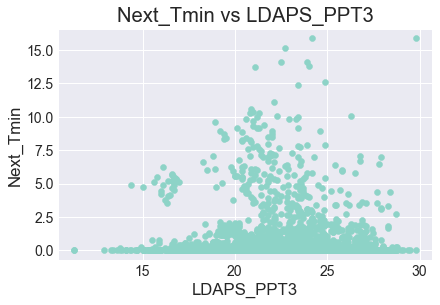

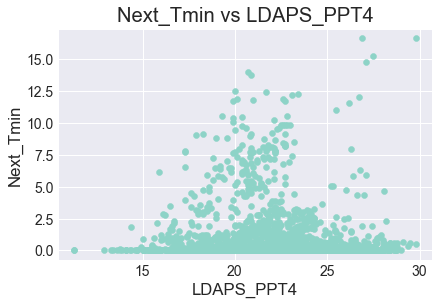

...

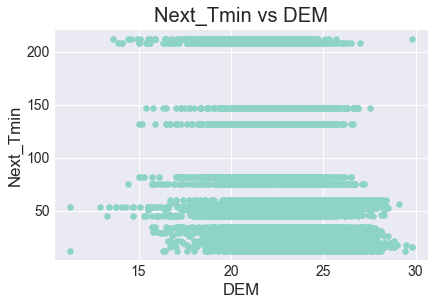

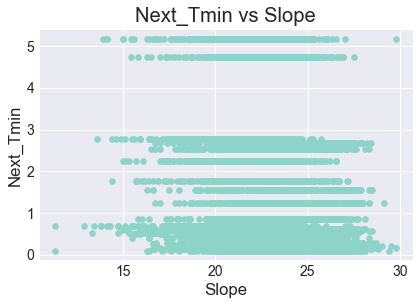

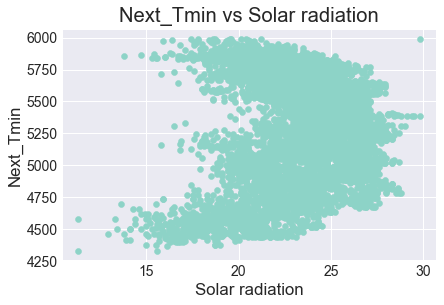

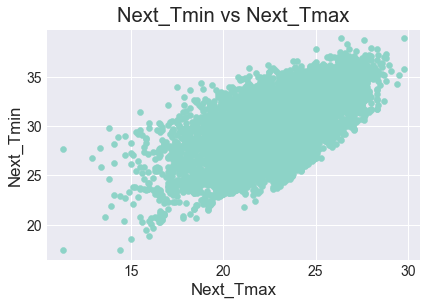

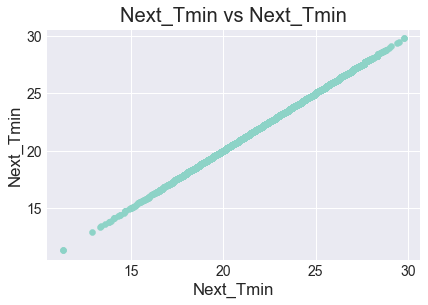

In [58]:
y_col = "Next_Tmin"

for x_col in df_scatter1:

    figure = plt.figure
    ax = plt.gca()
    ax.scatter(df[y_col], df_scatter1[x_col])
    ax.set_ylabel(y_col)
    ax.set_xlabel(x_col)
    ax.set_title("{} vs {}".format(y_col, x_col))

    
    plt.show()

this shows next day min temp along with lon,lat etc.,

In [59]:
df_scatter2 = df[['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3']]

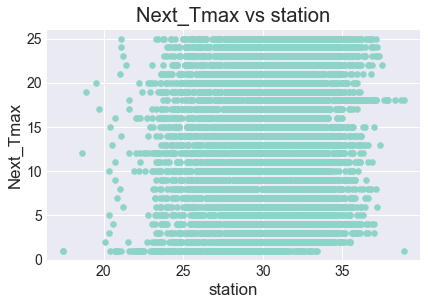

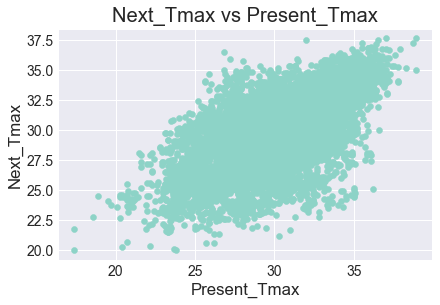

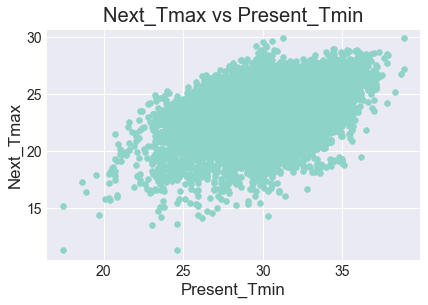

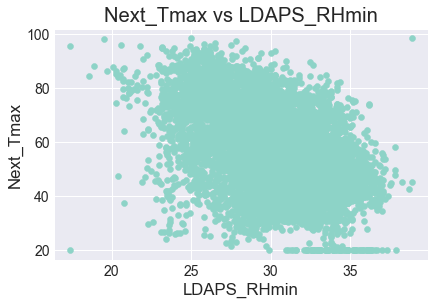

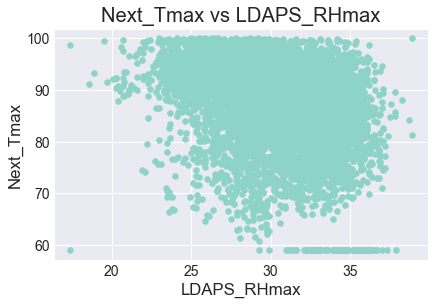

...

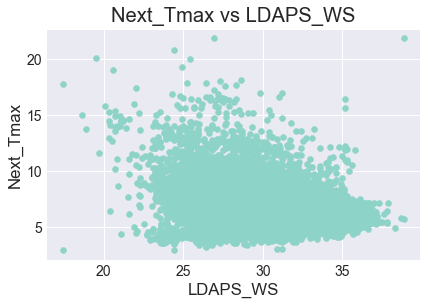

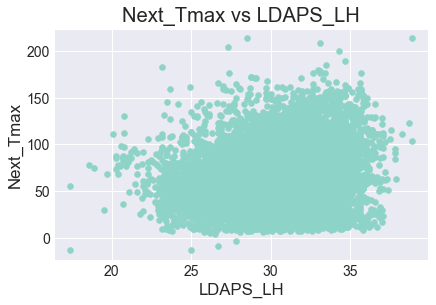

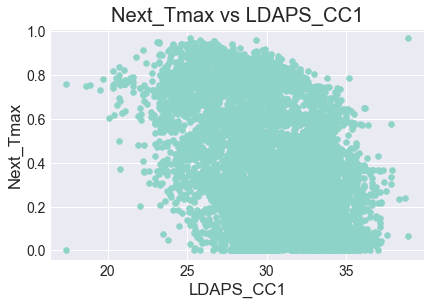

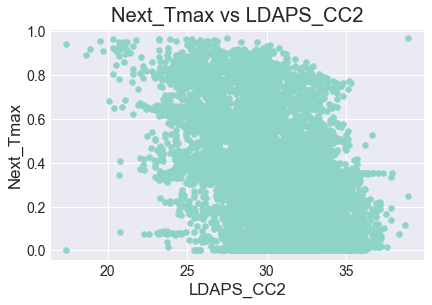

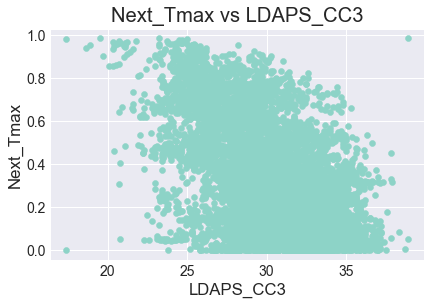

In [60]:
y_col = "Next_Tmax"

for x_col in df_scatter2:

    figure = plt.figure
    ax = plt.gca()
    ax.scatter(df[y_col], df_scatter2[x_col])
    ax.set_ylabel(y_col)
    ax.set_xlabel(x_col)
    ax.set_title("{} vs {}".format(y_col, x_col))
    plt.show()

if Present_Tmax, Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse increases the next day maximum temperature also increases

In [61]:
df_scatter3 = df[[ 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin']]

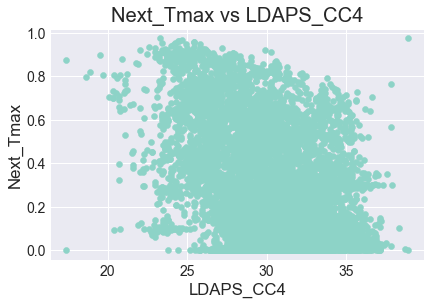

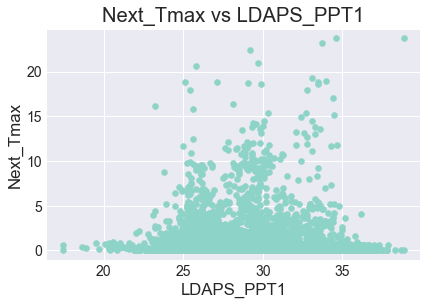

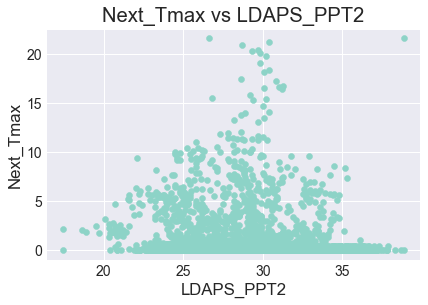

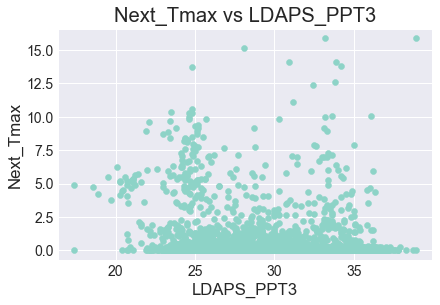

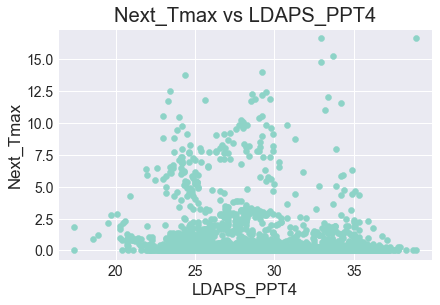

...

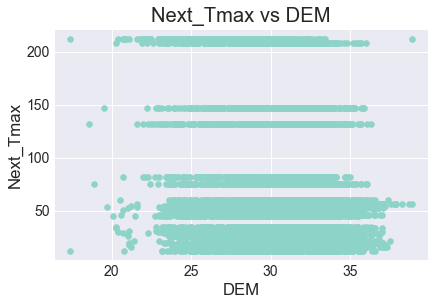

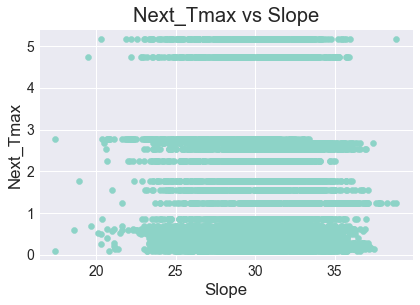

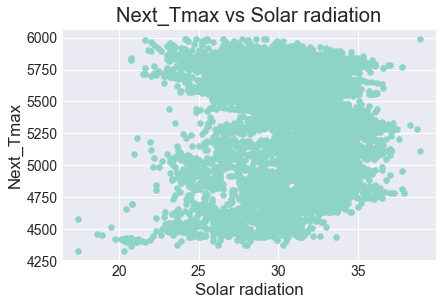

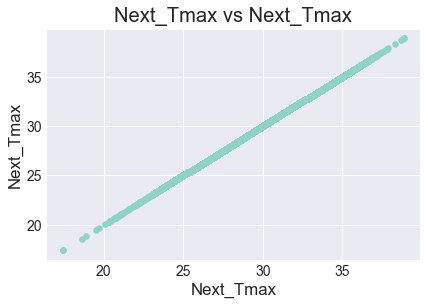

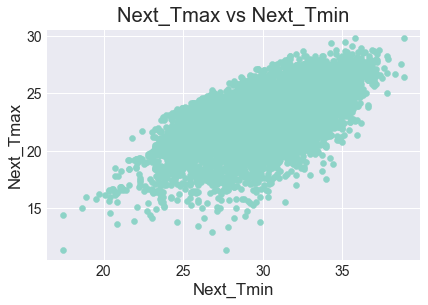

In [62]:
y_col = "Next_Tmax"
for x_col in df_scatter3:

    figure = plt.figure
    ax = plt.gca()
    ax.scatter(df[y_col], df_scatter3[x_col])
    ax.set_ylabel(y_col)
    ax.set_xlabel(x_col)
    ax.set_title("{} vs {}".format(y_col, x_col))
    plt.show()

this shows next day max temp along with lon,lat etc.,

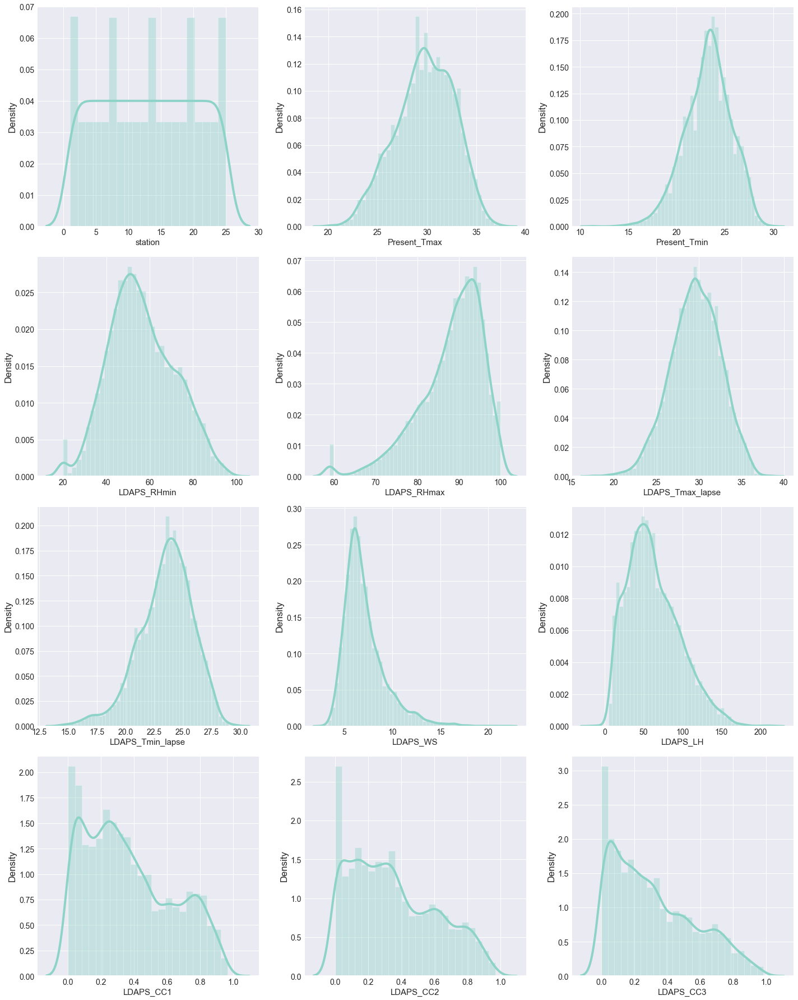

In [63]:
plt.figure(figsize = (20, 25))
plotnumber = 1

for col in df:
    if plotnumber <= 12:
        ax = plt.subplot(4, 3, plotnumber)
        sns.distplot(df[col])
        plt.xlabel(col, fontsize = 15)
        
    plotnumber += 1
    
plt.tight_layout()
plt.show()

humidity,wind speed,temp lapse,etc., are the columns has slight skewness

DATA PREPROCESSING AND FEATURE ENGINEERING

In [64]:
df=df.drop(['month','year'],axis=1)# used only for analysis purpose 

In [65]:
df1=df.reset_index()


In [66]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              7752 non-null   datetime64[ns]
 1   station           7752 non-null   float64       
 2   Present_Tmax      7752 non-null   float64       
 3   Present_Tmin      7752 non-null   float64       
 4   LDAPS_RHmin       7752 non-null   float64       
 5   LDAPS_RHmax       7752 non-null   float64       
 6   LDAPS_Tmax_lapse  7752 non-null   float64       
 7   LDAPS_Tmin_lapse  7752 non-null   float64       
 8   LDAPS_WS          7752 non-null   float64       
 9   LDAPS_LH          7752 non-null   float64       
 10  LDAPS_CC1         7752 non-null   float64       
 11  LDAPS_CC2         7752 non-null   float64       
 12  LDAPS_CC3         7752 non-null   float64       
 13  LDAPS_CC4         7752 non-null   float64       
 14  LDAPS_PPT1        7752 n

In [67]:
df1[['Date']] = df1[['Date']].astype(object)

In [68]:
#converting string data type to int type using LabelEncoding
le=LabelEncoder()

list1=['Date']
for val in list1:
    df1[val]=le.fit_transform(df1[val].astype(str))
df1

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,12,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,12,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,12,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,12,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,12,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,301,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,301,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,301,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,0,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [69]:
df2=df1

In [70]:
df1=df1.drop(['Next_Tmin'],axis=1)

In [71]:
#find correlation co.efficient of all variables in table
df1.corr()

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
Date,1.000000,0.000741,0.054395,0.024797,-0.031254,-0.144868,0.001246,-0.030787,-0.123142,0.056654,...,-0.096890,-0.059481,0.055060,0.022722,-0.000052,0.000061,-0.000414,-0.000449,-0.122366,0.047110
station,0.000741,1.000000,0.112756,0.132068,-0.064828,-0.154365,0.069306,0.105009,0.004234,-0.133787,...,-0.005204,-0.010773,-0.015294,-0.013279,-0.237467,-0.118603,-0.256138,-0.090461,-0.018814,0.108236
Present_Tmax,0.054395,0.112756,1.000000,0.618760,-0.216032,-0.307067,0.570129,0.623496,-0.121820,0.135463,...,-0.109006,-0.099449,-0.120367,-0.099607,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.610348
Present_Tmin,0.024797,0.132068,0.618760,1.000000,0.089975,-0.059914,0.464151,0.762993,-0.034675,-0.009258,...,0.112845,0.068176,-0.046126,-0.062965,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.471806
LDAPS_RHmin,-0.031254,-0.064828,-0.216032,0.089975,1.000000,0.611314,-0.547994,0.086848,0.285713,-0.068776,...,0.254948,0.379481,0.233573,0.163642,0.084541,-0.073998,0.099121,0.120115,0.248989,-0.454107
LDAPS_RHmax,-0.144868,-0.154365,-0.307067,-0.059914,0.611314,1.000000,-0.346380,-0.105882,0.125539,0.221313,...,0.249021,0.212474,0.124865,0.109323,0.181629,0.023808,0.164355,0.203716,0.157210,-0.308335
LDAPS_Tmax_lapse,0.001246,0.069306,0.570129,0.464151,-0.547994,-0.346380,1.000000,0.654021,-0.311996,0.048010,...,-0.111065,-0.242122,-0.188115,-0.160273,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.827189
LDAPS_Tmin_lapse,-0.030787,0.105009,0.623496,0.762993,0.086848,-0.105882,0.654021,1.000000,-0.130035,-0.134761,...,0.038056,0.000870,-0.088575,-0.094655,-0.096257,-0.026701,-0.195455,-0.185849,0.159975,0.586983
LDAPS_WS,-0.123142,0.004234,-0.121820,-0.034675,0.285713,0.125539,-0.311996,-0.130035,1.000000,0.006711,...,0.152587,0.191886,0.161684,0.144085,0.036657,-0.059466,0.191053,0.171629,0.121759,-0.342729
LDAPS_LH,0.056654,-0.133787,0.135463,-0.009258,-0.068776,0.221313,0.048010,-0.134761,0.006711,1.000000,...,-0.012542,-0.077545,0.016102,0.019979,0.133221,0.025822,0.055133,0.086781,-0.047384,0.157616


Present_Tmax,Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse are the columns which are positively correlated with the target column LDAPS_RHmin,LDAPS_RHmax, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4 are the columns which are negaitvely correlated with the target column lon column has zero correlation and there is multicollinearity between LDAPS_RHmin,LDAPS_CC1 and LDAPS_CC4.so we can drop the zero correlation column and any one of the multicollinearity column

<AxesSubplot:>

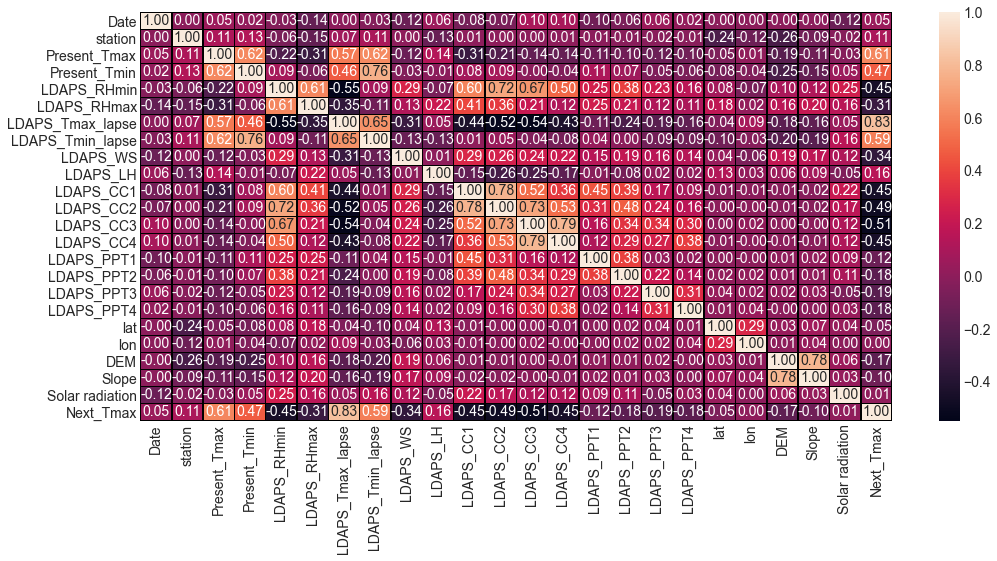

In [72]:
plt.figure(figsize=(15,7))
sns.heatmap(df1.corr(),annot=True,linewidths=0.5,linecolor="black",fmt='.2f')

Present_Tmax,Present_Tmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse are the columns which are positively correlated with the target column
LDAPS_RHmin,LDAPS_RHmax, LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4 are the columns which are negaitvely correlated with the target column
lon column has zero correlation and there is multicollinearity between LDAPS_RHmin,LDAPS_CC1 and LDAPS_CC4.so we can drop the zero correlation column and any one of the multicollinearity column

In [73]:
df1.describe()

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,154.460139,12.996904,29.768211,23.225059,56.401741,88.089988,29.613447,23.512589,7.097875,62.505019,...,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887
std,89.517454,7.213213,2.956557,2.403036,15.038788,7.715499,2.932898,2.333973,2.173245,33.567001,...,1.936331,1.754258,1.156174,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557
min,0.000000,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,77.000000,7.000000,27.800000,21.700000,45.735368,84.038809,27.693091,22.114651,5.686487,37.532764,...,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000
50%,154.000000,13.000000,29.900000,23.400000,54.828714,89.699505,29.662273,23.735942,6.563068,57.310630,...,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000
75%,232.000000,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,...,0.067593,0.024276,0.009697,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000
max,309.000000,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


the diff b/w 75% and max is not very high in overall.so there might be skewness and outliers present

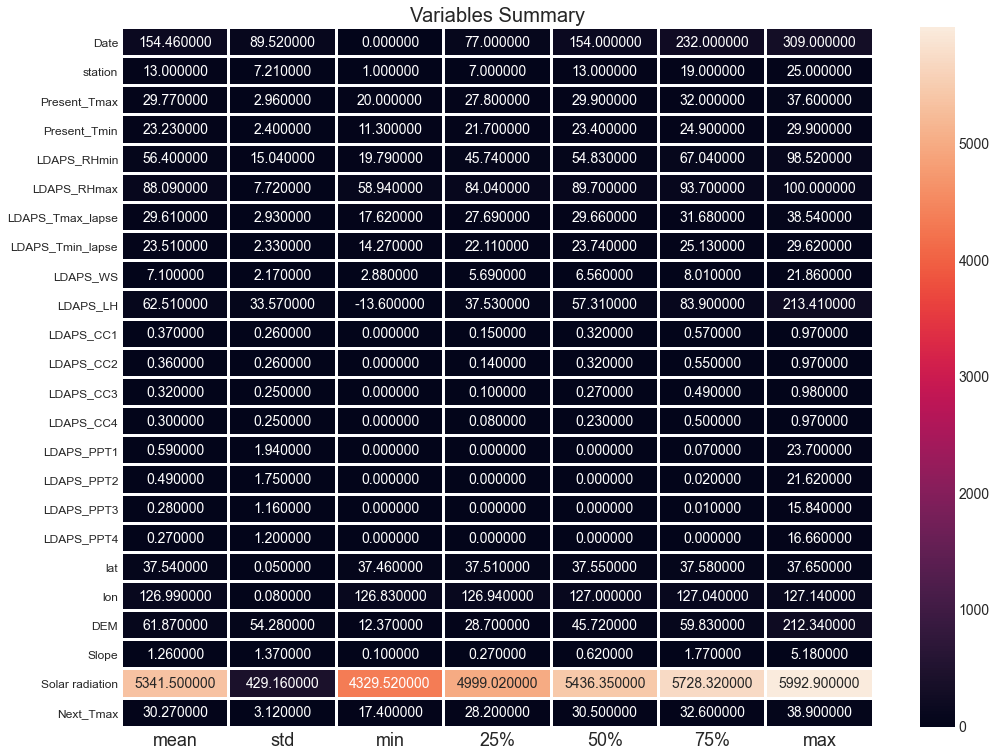

In [74]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df1.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("Variables Summary")
plt.show()

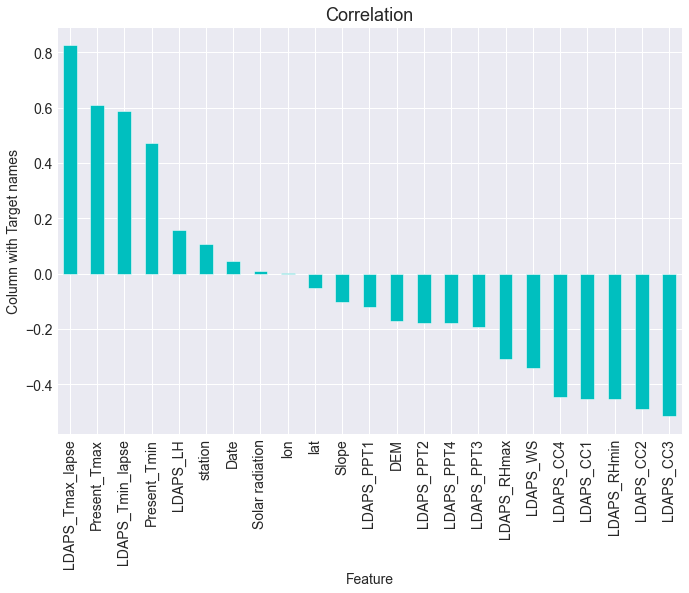

In [75]:
plt.figure(figsize=(10,7))
df1.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column with Target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

In [76]:
df1.shape

(7752, 24)

In [77]:
v=df1[list(df1.columns)[23]] 
df1=df1.drop(['Next_Tmax'],axis=1) 
df1

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,12,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996
1,12,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500
2,12,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664
3,12,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844
4,12,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,301,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965
7748,301,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535
7749,301,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215
7750,0,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508


In [78]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [79]:
df1.shape

(7752, 23)

In [80]:
#calculates vif
def calc_vif(df1):
    vif=pd.DataFrame()
    vif['Variables']=df1.columns
    vif['VIF FACTOR']=[variance_inflation_factor(df1.values,i)for i in range(df1.shape[1])]
    return(vif)


calc_vif(df1)

,Variables,VIF FACTOR
0,Date,4.510293
1,station,5.071035
2,Present_Tmax,282.347556
3,Present_Tmin,288.750603
4,LDAPS_RHmin,93.648484
5,LDAPS_RHmax,317.564819
6,LDAPS_Tmax_lapse,708.591414
7,LDAPS_Tmin_lapse,732.360310
8,LDAPS_WS,15.099402
9,LDAPS_LH,6.663134


In [81]:
#drop columns which has multicollinearity and zero correlations

df1=df1.drop(['lon'],axis=1)


In [82]:
calc_vif(df1)

,Variables,VIF FACTOR
0,Date,4.509312
1,station,4.919138
2,Present_Tmax,282.317826
3,Present_Tmin,288.734148
4,LDAPS_RHmin,92.772833
5,LDAPS_RHmax,317.119450
6,LDAPS_Tmax_lapse,708.472451
7,LDAPS_Tmin_lapse,730.754483
8,LDAPS_WS,15.054713
9,LDAPS_LH,6.655362


In [83]:
df1=df1.drop(['LDAPS_RHmin'],axis=1)


In [84]:
calc_vif(df1)

,Variables,VIF FACTOR
0,Date,4.474882
1,station,4.910378
2,Present_Tmax,276.037726
3,Present_Tmin,288.595643
4,LDAPS_RHmax,225.436867
5,LDAPS_Tmax_lapse,490.658856
6,LDAPS_Tmin_lapse,512.166130
7,LDAPS_WS,14.921188
8,LDAPS_LH,6.588535
9,LDAPS_CC1,10.329147


In [85]:
df1.shape

(7752, 21)

In [86]:
df1.insert(21,'Next_Tmax',v) 
df1

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,DEM,Slope,Solar radiation,Next_Tmax
0,12,1.0,28.7,21.4,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,212.3350,2.785000,5992.895996,29.1
1,12,2.0,31.9,21.6,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,44.7624,0.514100,5869.312500,30.5
2,12,3.0,31.6,23.3,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,33.3068,0.266100,5863.555664,31.1
3,12,4.0,32.0,23.4,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,45.7160,2.534800,5856.964844,31.7
4,12,5.0,31.4,21.9,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,35.0380,0.505500,5859.552246,31.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,301,23.0,23.3,17.1,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,15.5876,0.155400,4443.313965,28.3
7748,301,24.0,23.3,17.7,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,17.2956,0.222300,4438.373535,28.6
7749,301,25.0,23.2,17.4,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,19.5844,0.271300,4451.345215,27.8
7750,0,1.0,20.0,11.3,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,12.3700,0.098475,4329.520508,17.4


In [87]:
df1.shape[1]

22

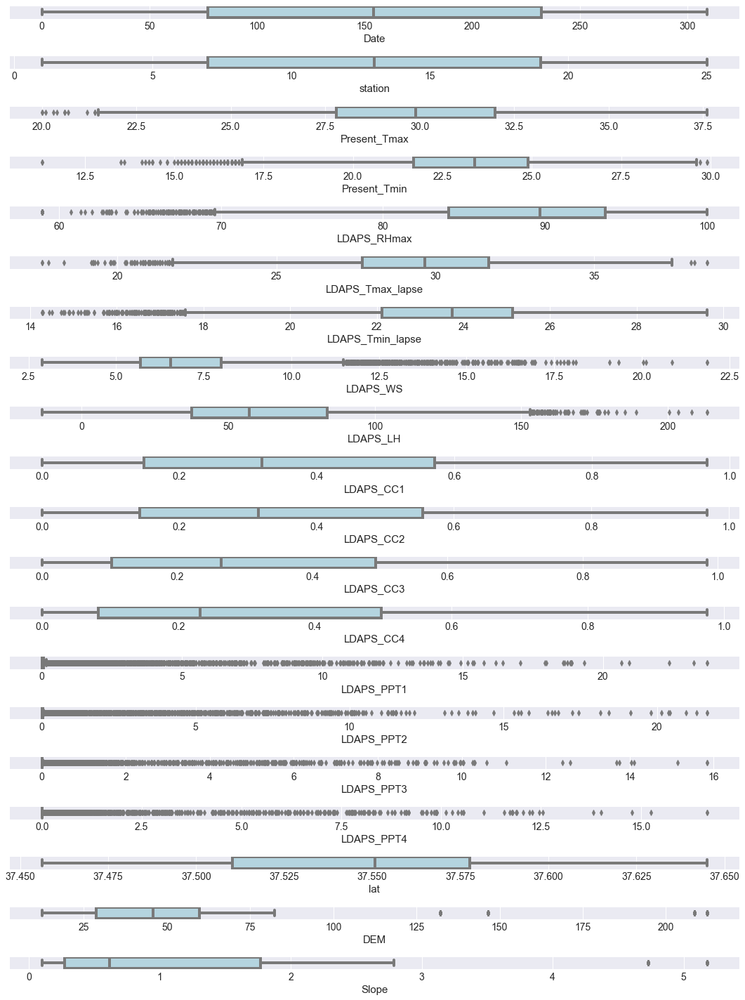

In [88]:
plt.figure(figsize= (15,20))
pltnum = 1
for i in df1:
    if pltnum <=20:
        plt.subplot(20,1,pltnum)
        sns.boxplot(df1[i],color = 'lightblue')
        plt.xlabel(i,fontsize=15)
    pltnum+=1
plt.tight_layout()

outliers are present

In [89]:
#ckeck skewness
df1.skew()

Date                0.000009
station             0.000100
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmax        -1.109283
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.581763
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
dtype: float64

#checking Z-score to remove outliers

In [90]:

import numpy as np
from scipy.stats import zscore
z=np.abs(zscore(df1))
z.shape


(7752, 22)

In [91]:
threshold=3
print(np.where(z>3))

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int64), array([ 7, 14, 14, ..., 14, 15, 16], dtype=int64))


In [92]:
df_new=df1[(z<3).all(axis=1)]
print(df1.shape)
print(df_new.shape)

(7752, 22)
(6862, 22)


some outliers got removed

In [93]:
#finds data loss
loss_percent=(7752-6862)/(7752*100)
print(loss_percent)

0.001148090815273478


data loss percentage is very low.data is cleaned also

In [94]:
df_new


,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,DEM,Slope,Solar radiation,Next_Tmax
0,12,1.0,28.7,21.4,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,0.0,0.0,0.0,0.0,37.6046,212.3350,2.7850,5992.895996,29.1
1,12,2.0,31.9,21.6,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,0.0,0.0,0.0,0.0,37.6046,44.7624,0.5141,5869.312500,30.5
2,12,3.0,31.6,23.3,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,0.0,0.0,0.0,0.0,37.5776,33.3068,0.2661,5863.555664,31.1
3,12,4.0,32.0,23.4,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.134249,0.0,0.0,0.0,0.0,37.6450,45.7160,2.5348,5856.964844,31.7
4,12,5.0,31.4,21.9,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.170021,0.0,0.0,0.0,0.0,37.5507,35.0380,0.5055,5859.552246,31.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,301,21.0,23.1,17.8,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,...,0.004380,0.0,0.0,0.0,0.0,37.5507,26.2980,0.5721,4456.024414,27.6
7746,301,22.0,22.5,17.4,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,...,0.017678,0.0,0.0,0.0,0.0,37.5102,21.9668,0.1332,4441.803711,28.0
7747,301,23.0,23.3,17.1,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.000000,0.0,0.0,0.0,0.0,37.5372,15.5876,0.1554,4443.313965,28.3
7748,301,24.0,23.3,17.7,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.000000,0.0,0.0,0.0,0.0,37.5237,17.2956,0.2223,4438.373535,28.6


In [95]:
df_new.shape

(6862, 22)

In [96]:
#seggregate input data and output data
x=df_new.iloc[:,:-1]
y=df_new.iloc[:,-1]

In [97]:
#removing skewness using power transform
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[-1.81452777, -1.87147563, -0.47287426, ...,  1.85429784,
         1.33168498,  1.883549  ],
       [-1.81452777, -1.65970927,  0.67547827, ...,  0.07098271,
        -0.37285344,  1.42521627],
       [-1.81452777, -1.46619182,  0.56235737, ..., -0.35236313,
        -0.94332383,  1.40474692],
       ...,
       [ 1.50359396,  1.3094704 , -2.12164613, ..., -1.57704501,
        -1.27932694, -1.7766254 ],
       [ 1.50359396,  1.42500043, -2.12164613, ..., -1.39765912,
        -1.06880493, -1.78268073],
       [ 1.50359396,  1.53931418, -2.14878896, ..., -1.18804856,
        -0.92901535, -1.76672661]])

In [98]:
#scaling to get better model performance
from sklearn.preprocessing import MinMaxScaler
mmscaler = MinMaxScaler()
x = mmscaler.fit_transform(x)
x

array([[0.08816356, 0.        , 0.3842652 , ..., 1.        , 0.8690859 ,
        1.        ],
       [0.08816356, 0.06208719, 0.58547201, ..., 0.53595898, 0.34204995,
        0.87763055],
       [0.08816356, 0.11882403, 0.56565171, ..., 0.42579907, 0.16566296,
        0.87216548],
       ...,
       [0.98113816, 0.93261274, 0.09537819, ..., 0.10712145, 0.06177224,
        0.02277648],
       [0.98113816, 0.96648467, 0.09537819, ..., 0.15379991, 0.12686474,
        0.02115978],
       [0.98113816, 1.        , 0.0906224 , ..., 0.20834322, 0.17008708,
        0.02541934]])

MODEL EVALUATION

REGRESSION :

Linear Regression

In [99]:
#Linear Regression
#model fitting
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split



In [100]:
#getting best accuracy with help of selecting random state
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i},the training accuracy is:{r2_score(y_train,pred_train)*100}")
    print(f"At random state {i},the testing accuracy is:{r2_score(y_test,pred_test)*100}")
    print("\n")
    
    
    
    

At random state 0,the training accuracy is:75.38961051388735
At random state 0,the testing accuracy is:75.2853278921236


At random state 1,the training accuracy is:75.36176456385222
At random state 1,the testing accuracy is:75.45858632442962


At random state 2,the training accuracy is:75.08454776821418
At random state 2,the testing accuracy is:76.53850689860727


At random state 3,the training accuracy is:75.72228139535592
At random state 3,the testing accuracy is:74.01634277074926


At random state 4,the training accuracy is:75.16990200973767
At random state 4,the testing accuracy is:76.1945585530417


At random state 5,the training accuracy is:75.28591815188538
At random state 5,the testing accuracy is:75.70414115891955


At random state 6,the training accuracy is:75.20023740862244
At random state 6,the testing accuracy is:76.08893463840631


At random state 7,the training accuracy is:75.73786559656625
At random state 7,the testing accuracy is:73.9285500950839


At random state 8,t

In [101]:
#evaluation metrics

print("Accuracy:", r2_score(y_test,pred_test)*100)

Accuracy: 74.83076818041471


In [102]:
#cross validation at random state
Train_accuracy=(r2_score(y_train,pred_train)*100)
Test_accuracy=r2_score(y_test,pred_test)*100
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()*100
    print(f"At cross fold {j} the cv score is {cv_mean} and accuracy score for Training is {Train_accuracy} and accuracy score for Testing is {Test_accuracy}")
    print("\n")
    

At cross fold 2 the cv score is 53.963681811947396 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 3 the cv score is 66.0951250076797 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 4 the cv score is 67.85155975511367 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 5 the cv score is 67.27618806986486 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 6 the cv score is 67.62431623907234 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 7 the cv score is 67.53090205561702 and accuracy score for Training is 75.49857994858894 and accuracy score for Testing is 74.83076818041471


At cross fold 8 the cv score is 67.92266085564785 and accu

parameter tuning

In [103]:
#perform gridsearchcv and cross val score on LinearRegression
from sklearn.model_selection import GridSearchCV

parameters={ 'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True,False], 'n_jobs':[None,1,-1], 'positive':[True,False]}
lr=LinearRegression()
clf=GridSearchCV(lr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': True, 'positive': False}


In [104]:
lr=LinearRegression(copy_X= True, fit_intercept= True, n_jobs= None, normalize= True, positive= False)
lr.fit(x_train,y_train)
pred_test_lr=lr.predict(x_test)
pred_train_lr=lr.predict(x_train)
lr_score = lr.score(x_train,y_train)
lr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",lr_acc_score*100)
print("score of model is:",lr_score*100)

Accuracy score is: 74.83076818041471
score of model is: 75.49857994858895


In [105]:
cv_score_lr=cross_val_score(lr,x,y,cv=5)
cv_mean_lr=cv_score_lr.mean()
print("cv_mean is:",cv_mean_lr*100)

cv_mean is: 67.27618806986484


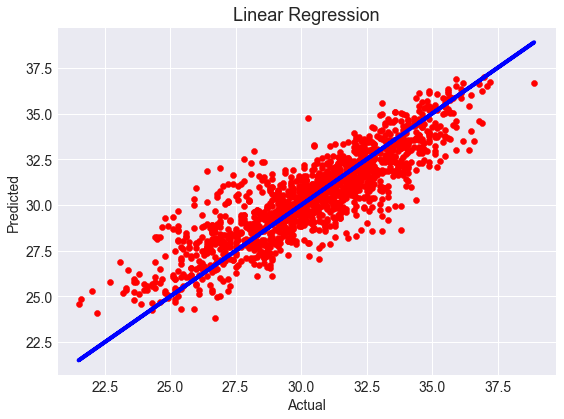

In [106]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

In [107]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test))
print("mean squared error",mean_squared_error(y_test,pred_test))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test)))
print("r2_score is",r2_score(y_test,pred_test)*100)

mean absolute error 1.100780595255735
mean squared error 2.08381106863231
Root mean squared error 1.443541155849846
r2_score is 74.83076818041471


LASSO REGRESSION

parameter tuning

In [108]:
#perform gridsearchcv and cross val score on lasso regression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import Lasso
parameters={'alpha':[0.0001,0.001,0.01,0.1,1,10],'random_state':list(range(0,10)),'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001]}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'alpha': 0.0001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [109]:
ls=Lasso(alpha=1,random_state=0,fit_intercept= True, normalize= False,tol= 0.001)
ls.fit(x_train,y_train)
pred_test_ls=ls.predict(x_test)
pred_train_ls=ls.predict(x_train)
ls_score = ls.score(x_train,y_train)
ls_acc_score=r2_score(y_test,pred_test_ls)
print("Accuracy score is:",ls_acc_score*100)


Accuracy score is: -0.07436914282064055


In [110]:
#checks cv score
for u in range(2,10):
    cv_score_ls=cross_val_score(ls,x,y,cv=5)
    cv_mean_ls=cv_score_ls.mean()
    print("At cv :-",j )
    print("cv_score is:",cv_mean_ls*100)
    print("accuracy score---r2_score is",ls_acc_score*100)

At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055
At cv :- 9
cv_score is: -7.950828100318157
accuracy score---r2_score is -0.07436914282064055


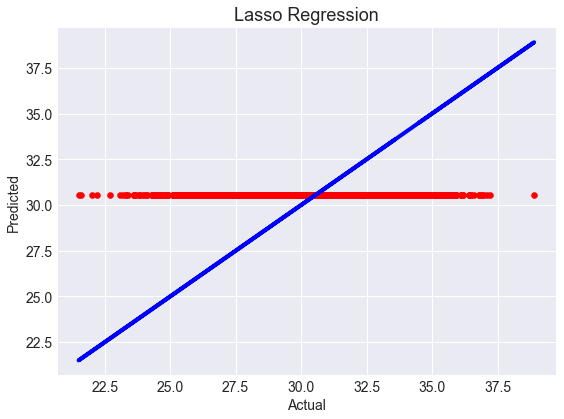

In [111]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_ls,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

In [112]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_ls))
print("mean squared error",mean_squared_error(y_test,pred_test_ls))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_ls)))
print("r2_score is",r2_score(y_test,pred_test_ls)*100)

mean absolute error 2.326205646078877
mean squared error 8.285357280707082
Root mean squared error 2.8784296553341515
r2_score is -0.07436914282064055


RANDOM FOREST REGRESSION

parameter tuning

In [113]:
#perform gridsearchcv and cross val score on RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
parameters={'criterion':['friedman_mse','mae'],'max_features':["auto","sqrt","log2"],'bootstrap': [True, False],'min_samples_split':[1,2],'min_samples_leaf':[1,2]}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

                                                      


{'bootstrap': False, 'criterion': 'friedman_mse', 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}


In [114]:
rf=RandomForestRegressor(criterion="mae",max_features="log2",bootstrap= True,min_samples_leaf= 2, min_samples_split= 2)
rf.fit(x_train,y_train)
pred_test_rf=rf.predict(x_test)
pred_train_rf=rf.predict(x_train)
rf_score = rf.score(x_train,y_train)
rf_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",rf_acc_score*100)
print("score of model is:",rf_score*100)

Accuracy score is: 74.83076818041471
score of model is: 96.52632004413194


In [115]:
cv_score_rf=cross_val_score(rf,x,y,cv=5)
cv_mean_rf=cv_score_rf.mean()
print("cv_mean is:",cv_mean_rf*100)

cv_mean is: 64.758768788328


In [116]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rf))
print("mean squared error",mean_squared_error(y_test,pred_test_rf))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rf)))
print("r2_score is",r2_score(y_test,pred_test_rf)*100)

mean absolute error 0.7195714654089385
mean squared error 0.8761655198282812
Root mean squared error 0.9360371359237203
r2_score is 89.41726847849054


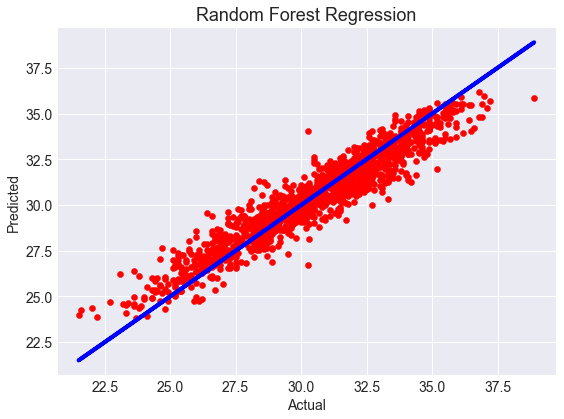

In [117]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rf,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Random Forest Regression',fontsize=18)
plt.show()

RIDGE REGRESSION

In [118]:
#perform gridsearchcv and cross val score on Ridge Regressor
from sklearn.linear_model import Ridge
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
rd=Ridge()
clf=GridSearchCV(rd,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'alpha': 0.001, 'fit_intercept': True, 'normalize': True, 'random_state': 0, 'tol': 0.001}


In [119]:
rd=Ridge(alpha=0.001,fit_intercept=True,normalize=True,random_state=0,tol=0.001)
rd.fit(x_train,y_train)
pred_test_rd=rd.predict(x_test)
pred_train_rd=rd.predict(x_train)
rd_score = rd.score(x_train,y_train)
rd_acc_score=r2_score(y_test,pred_test_rd)
print("Accuracy score is:",rd_acc_score*100)
print("score of model is:",rd_score*100)

Accuracy score is: 74.83362549875719
score of model is: 75.49851062127414


In [120]:
cv_score_rd=cross_val_score(rd,x,y,cv=5)
cv_mean_rd=cv_score_rd.mean()
print("cv_mean is:",cv_mean_rd*100)

cv_mean is: 67.28282701645273


In [121]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rd))
print("mean squared error",mean_squared_error(y_test,pred_test_rd))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rd)))
print("r2_score is",r2_score(y_test,pred_test_rd)*100)

mean absolute error 1.100727590218804
mean squared error 2.0835745055289414
Root mean squared error 1.4434592150556043
r2_score is 74.83362549875719


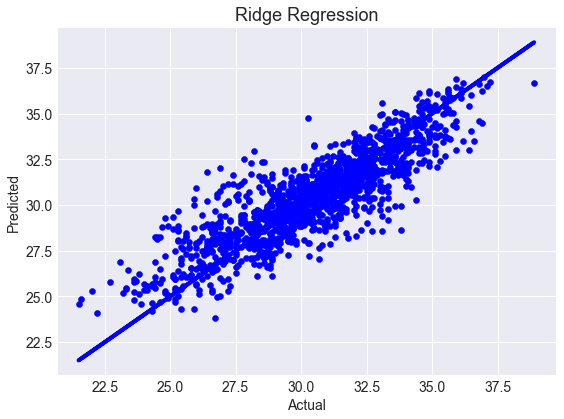

In [122]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rd,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

DECISION TREE REGRESSOR

In [123]:
#perform gridsearchcv and cross val score on Decison Tree Regressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
parameters={'criterion':['mse','friedman_mse','mae','poisson'],'splitter':['best','random'],'max_features':['auto', 'sqrt', 'log2'],'random_state':list(range(0,10)),'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
dt=DecisionTreeRegressor()
clf=GridSearchCV(dt,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

                  

{'criterion': 'mae', 'max_features': 'auto', 'min_weight_fraction_leaf': 0.1, 'random_state': 0, 'splitter': 'best'}


In [124]:
dt=DecisionTreeRegressor(criterion='mse',max_features= 'auto', min_weight_fraction_leaf= 0.1, random_state= 1, splitter= 'random')
dt.fit(x_train,y_train)
pred_test_dt=dt.predict(x_test)
pred_train_dt=dt.predict(x_train)
dt_score = dt.score(x_train,y_train)
dt_acc_score=r2_score(y_test,pred_test_dt)
print("Accuracy score is:",dt_acc_score*100)
print("score of model is:",dt_score*100)


Accuracy score is: 50.72642177381515
score of model is: 54.75047173974738


In [125]:
cv_score_dt=cross_val_score(dt,x,y,cv=5)
cv_mean_dt=cv_score_dt.mean()
print("cv_mean is:",cv_mean_dt*100)

cv_mean is: 45.769989964175075


In [126]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_dt))
print("mean squared error",mean_squared_error(y_test,pred_test_dt))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_dt)))
print("r2_score is",r2_score(y_test,pred_test_dt)*100)

mean absolute error 1.595621570412397
mean squared error 4.079458142975448
Root mean squared error 2.0197668536183695
r2_score is 50.72642177381515


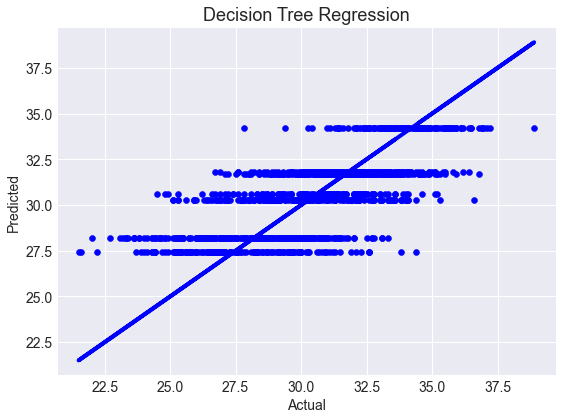

In [127]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_dt,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

GRADIENT BOOSTING REGRESSOR

In [128]:
#perform gridsearchcv and cross val score on  GradientBoostingRegressor
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters={'loss':['ls','lad','huber','quantile'],'n_estimators':[50,100],'criterion':['friedman_mse','mse'],'learning_rate':[0.05],'max_depth' : [1,3,5,7,9,11,12],'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
gbr=GradientBoostingRegressor()
clf=GridSearchCV(gbr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)



{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'ls', 'max_depth': 9, 'min_weight_fraction_leaf': 0.1, 'n_estimators': 100}


In [129]:

gbr=GradientBoostingRegressor(criterion='friedman_mse',loss='huber',n_estimators=100,learning_rate= 0.05,max_depth= 5, min_weight_fraction_leaf= 0.1)
gbr.fit(x_train,y_train)
pred_test_gbr=gbr.predict(x_test)
pred_train_gbr=gbr.predict(x_train)
gbr_score = gbr.score(x_train,y_train)
gbr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",gbr_acc_score*100)
print("score of model is:",gbr_score*100)

Accuracy score is: 74.83076818041471
score of model is: 81.0399930275165


In [130]:
cv_score_gbr=cross_val_score(gbr,x,y,cv=5)
cv_mean_gbr=cv_score_gbr.mean()
print("cv_mean is:",cv_mean_gbr*100)

cv_mean is: 68.11127186732526


In [131]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_gbr))
print("mean squared error",mean_squared_error(y_test,pred_test_gbr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_gbr)))
print("r2_score is",r2_score(y_test,pred_test_gbr)*100)

mean absolute error 1.0093250279894537
mean squared error 1.7567956199847874
Root mean squared error 1.3254416697783376
r2_score is 78.7806116952576


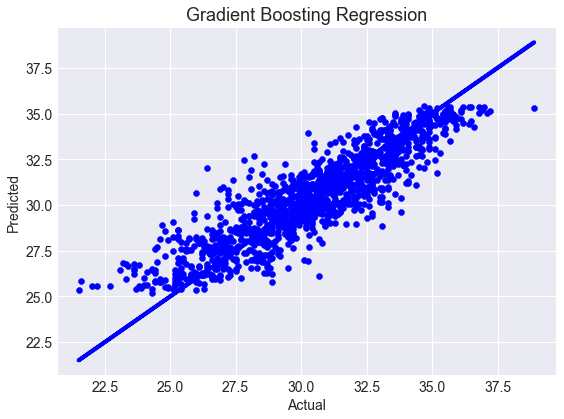

In [132]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_gbr,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Gradient Boosting Regression',fontsize=18)
plt.show()

SUPPORT VECTOR REGRESSOR

In [133]:
#perform gridsearchcv and cross val score on Support Vector Regressor
from sklearn.svm import SVR
parameters ={'kernel':['linear','poly','rbf','sigmoid'],'gamma':['scale', 'auto'],'tol':[0.01,0.0001,0.001],'shrinking':[True,False],'degree':[3,4,5],'max_iter':[1,2,-1]}
sv=SVR()
clf=GridSearchCV(sv,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)


{'degree': 5, 'gamma': 'scale', 'kernel': 'poly', 'max_iter': -1, 'shrinking': True, 'tol': 0.01}


In [134]:
sv=SVR(kernel='poly',gamma='scale',degree= 5, max_iter= -1, shrinking= False, tol= 0.0001)
sv.fit(x_train,y_train)
pred_test_sv=sv.predict(x_test)
pred_train_sv=sv.predict(x_train)
sv_score = sv.score(x_train,y_train)
sv_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",sv_acc_score*100)
print("score of model is:",sv_score*100)

Accuracy score is: 74.83076818041471
score of model is: 93.5207204930292


In [135]:
cv_score_sv=cross_val_score(sv,x,y,cv=5)
cv_mean_sv=cv_score_sv.mean()
print("cv_mean is:",cv_mean_sv*100)

cv_mean is: 9.531748845568137


In [136]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_sv))
print("mean squared error",mean_squared_error(y_test,pred_test_sv))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_sv)))
print("r2_score is",r2_score(y_test,pred_test_sv)*100)

mean absolute error 0.7667985838484244
mean squared error 1.0878646054775427
Root mean squared error 1.0430074810266428
r2_score is 86.8602692174214


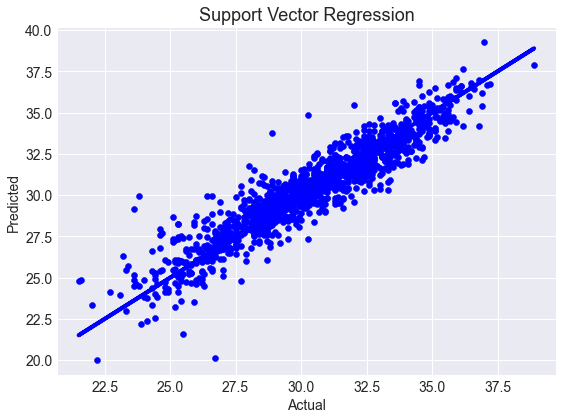

In [137]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_sv,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Support Vector Regression',fontsize=18)
plt.show()

ELASTIC NET REGRESSION(COMBINATION OF L1 AND L2)

In [138]:
from sklearn.linear_model import ElasticNet
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
enr=ElasticNet()
clf=GridSearchCV(enr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [139]:
enr=ElasticNet(alpha=0.0001,fit_intercept= True,normalize= False, random_state= 0, tol= 0.001)
enr.fit(x_train,y_train)
pred_test_enr=enr.predict(x_test)
pred_train_enr=enr.predict(x_train)
enr_score = enr.score(x_train,y_train)
enr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",enr_acc_score*100)
print("score of model is:",enr_score*100)

Accuracy score is: 74.83076818041471
score of model is: 75.4982778128521


In [140]:
cv_score_enr=cross_val_score(enr,x,y,cv=5)
cv_mean_enr=cv_score_enr.mean()
print("cv_mean is:",cv_mean_enr*100)

cv_mean is: 67.28612861573998


In [141]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_enr))
print("mean squared error",mean_squared_error(y_test,pred_test_enr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_enr)))
print("r2_score is",r2_score(y_test,pred_test_enr)*100)

mean absolute error 1.1007218520239208
mean squared error 2.0833623104631642
Root mean squared error 1.443385710911385
r2_score is 74.83618848869513


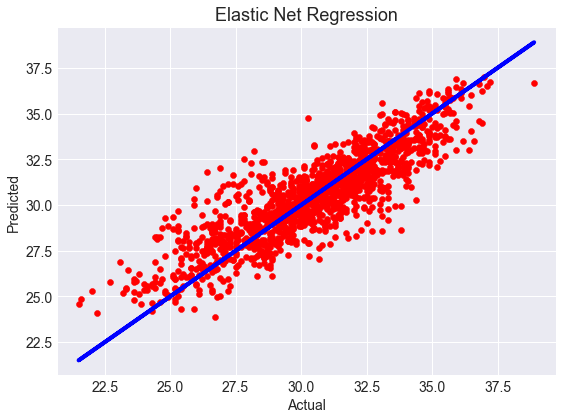

In [142]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_enr,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Elastic Net Regression',fontsize=18)
plt.show()

CONCLUSION

OUTPUT
 


In [149]:
import numpy as np
a=np.array(y_test)
predicted=np.array(rd.predict(x_test))
df_con=pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_con


,Original,Predicted
0,33.6,34.111179
1,26.9,28.782806
2,34.5,33.038185
3,30.7,30.915728
4,33.5,34.513239
...,...,...
1368,27.1,27.721871
1369,28.0,28.658393
1370,29.7,31.910158
1371,29.1,30.172818


In [232]:
import pickle
filename='Temperature_Forecast_rd.pkl'
pickle.dump(rd,open(filename,'wb'))


In [233]:
models=['Linear Regression','Lasso regression','RandomForestRegressor','Ridge Regressor','Decison Tree Regressor','GradientBoostingRegressor'
,'Support Vector Regressor','ElasticNet Regression']
        


In [152]:
scores=[ r2_score(y_test,pred_test)*100,ls_acc_score*100,rf_acc_score*100,rd_acc_score*100,dt_acc_score*100,gbr_acc_score*100,sv_acc_score*100,enr_acc_score*100]
scores

[74.83076818041471,
 -0.07436914282064055,
 74.83076818041471,
 74.83362549875719,
 50.72642177381515,
 74.83076818041471,
 74.83076818041471,
 74.83076818041471]

In [153]:
Nos=[]
for i in range(1,len(models)+1):
    Nos.append(i)
Nos    

[1, 2, 3, 4, 5, 6, 7, 8]

In [154]:
import pandas as pd
Model_scores=pd.DataFrame({})
Model_scores['Nos']=Nos
Model_scores['Model Names']=models
Model_scores['Scores']=scores
Model_scores.sort_values(by='Scores', ascending=False).style.hide_index()

Nos,Model Names,Scores
4,Ridge Regressor,74.833625
1,Linear Regression,74.830768
3,RandomForestRegressor,74.830768
6,GradientBoostingRegressor,74.830768
7,Support Vector Regressor,74.830768
8,ElasticNet Regression,74.830768
5,Decison Tree Regressor,50.726422
2,Lasso regression,-0.074369


CONCLUSION

From the above models,Ridge Regressor performs well,Because Ridge regression is a model tuning method that is used to analyse any data that suffers from multicollinearity. This method performs L2 regularization. When the issue of multicollinearity occurs, least-squares are unbiased, and variances are large, this results in predicted values to be far away from the actual values.

So we save this model for our analysis

The next day Temperature of Next_Tmax can be predicted and mainly depends on Present_Tmax, Present_Tmin,LDAPS_Tmax_lapse, LDAPS_Tmin_lapse and other factors

In [252]:
df_con.to_csv("Temperature_Forecast_rd.csv",sep='\t')

PREDICTION FOR NEXT DAY MIN TEMPERATURE

In [155]:
df2

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,12,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,12,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,12,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,12,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,12,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,301,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,301,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,301,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,0,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [156]:
df2=df2.drop(['Next_Tmax'],axis=1)

In [158]:
#find correlation co.efficient of all variables in table
df2.corr()

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin
Date,1.000000,0.000741,0.054395,0.024797,-0.031254,-0.144868,0.001246,-0.030787,-0.123142,0.056654,...,-0.096890,-0.059481,0.055060,0.022722,-0.000052,0.000061,-0.000414,-0.000449,-0.122366,0.000323
station,0.000741,1.000000,0.112756,0.132068,-0.064828,-0.154365,0.069306,0.105009,0.004234,-0.133787,...,-0.005204,-0.010773,-0.015294,-0.013279,-0.237467,-0.118603,-0.256138,-0.090461,-0.018814,0.128659
Present_Tmax,0.054395,0.112756,1.000000,0.618760,-0.216032,-0.307067,0.570129,0.623496,-0.121820,0.135463,...,-0.109006,-0.099449,-0.120367,-0.099607,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.622741
Present_Tmin,0.024797,0.132068,0.618760,1.000000,0.089975,-0.059914,0.464151,0.762993,-0.034675,-0.009258,...,0.112845,0.068176,-0.046126,-0.062965,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.796670
LDAPS_RHmin,-0.031254,-0.064828,-0.216032,0.089975,1.000000,0.611314,-0.547994,0.086848,0.285713,-0.068776,...,0.254948,0.379481,0.233573,0.163642,0.084541,-0.073998,0.099121,0.120115,0.248989,0.070674
LDAPS_RHmax,-0.144868,-0.154365,-0.307067,-0.059914,0.611314,1.000000,-0.346380,-0.105882,0.125539,0.221313,...,0.249021,0.212474,0.124865,0.109323,0.181629,0.023808,0.164355,0.203716,0.157210,-0.100245
LDAPS_Tmax_lapse,0.001246,0.069306,0.570129,0.464151,-0.547994,-0.346380,1.000000,0.654021,-0.311996,0.048010,...,-0.111065,-0.242122,-0.188115,-0.160273,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.586868
LDAPS_Tmin_lapse,-0.030787,0.105009,0.623496,0.762993,0.086848,-0.105882,0.654021,1.000000,-0.130035,-0.134761,...,0.038056,0.000870,-0.088575,-0.094655,-0.096257,-0.026701,-0.195455,-0.185849,0.159975,0.880176
LDAPS_WS,-0.123142,0.004234,-0.121820,-0.034675,0.285713,0.125539,-0.311996,-0.130035,1.000000,0.006711,...,0.152587,0.191886,0.161684,0.144085,0.036657,-0.059466,0.191053,0.171629,0.121759,-0.096576
LDAPS_LH,0.056654,-0.133787,0.135463,-0.009258,-0.068776,0.221313,0.048010,-0.134761,0.006711,1.000000,...,-0.012542,-0.077545,0.016102,0.019979,0.133221,0.025822,0.055133,0.086781,-0.047384,-0.055440


Present_Tmax, Present_Tmin, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse are the most positively correlated with the target column and Date column has zero correlation with the target column.DEM is the most negatively correlated with the target column

there is mulicollinearity present between lon and LDAPS_cc3 so we can drop any one of these columns with the help of vif

<AxesSubplot:>

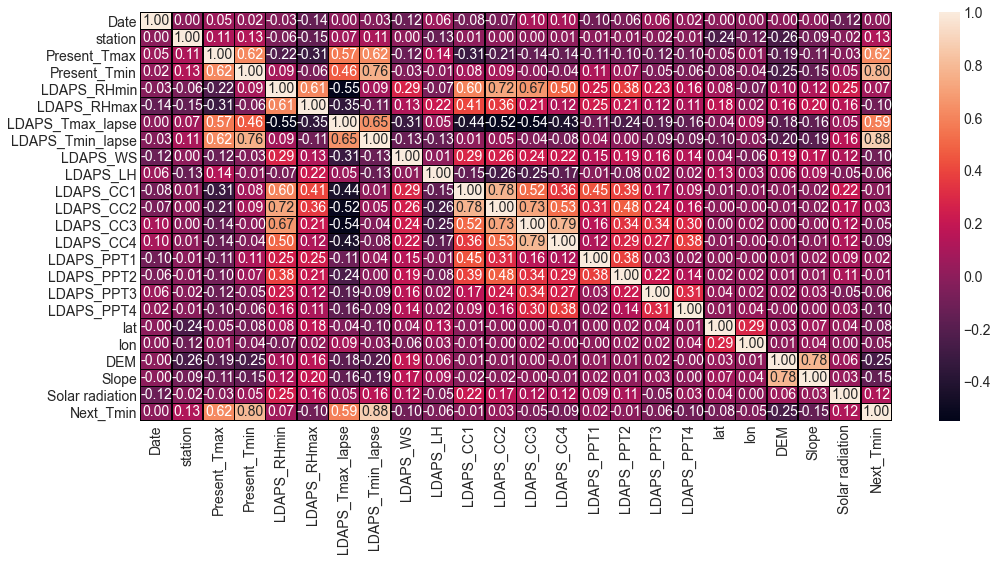

In [159]:
plt.figure(figsize=(15,7))
sns.heatmap(df2.corr(),annot=True,linewidths=0.5,linecolor="black",fmt='.2f')

Present_Tmax, Present_Tmin, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse are the most positively correlated with the target column and Date column has zero correlation with the target column.DEM is the most negatively correlated with the target column

there is mulicollinearity present between lon and LDAPS_cc3 so we can drop any one of these columns with the help of vif

In [161]:
df2.describe()

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,154.460139,12.996904,29.768211,23.225059,56.401741,88.089988,29.613447,23.512589,7.097875,62.505019,...,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,22.932220
std,89.517454,7.213213,2.956557,2.403036,15.038788,7.715499,2.932898,2.333973,2.173245,33.567001,...,1.936331,1.754258,1.156174,1.200364,0.050352,0.079435,54.279780,1.370444,429.158867,2.483276
min,0.000000,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,11.300000
25%,77.000000,7.000000,27.800000,21.700000,45.735368,84.038809,27.693091,22.114651,5.686487,37.532764,...,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,21.400000
50%,154.000000,13.000000,29.900000,23.400000,54.828714,89.699505,29.662273,23.735942,6.563068,57.310630,...,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,23.100000
75%,232.000000,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,...,0.067593,0.024276,0.009697,0.000693,37.577600,127.042000,59.832400,1.767800,5728.316406,24.600000
max,309.000000,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,29.800000


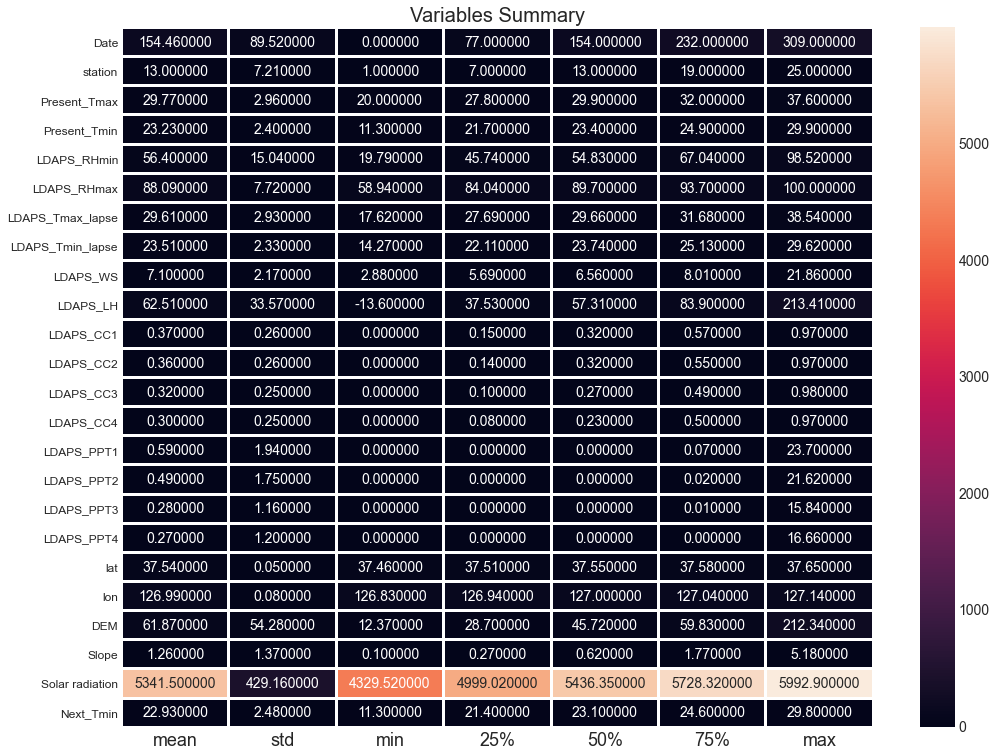

In [162]:
plt.figure(figsize=(15,12))
sns.heatmap(round(df2.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=12)
plt.title("Variables Summary")
plt.show()

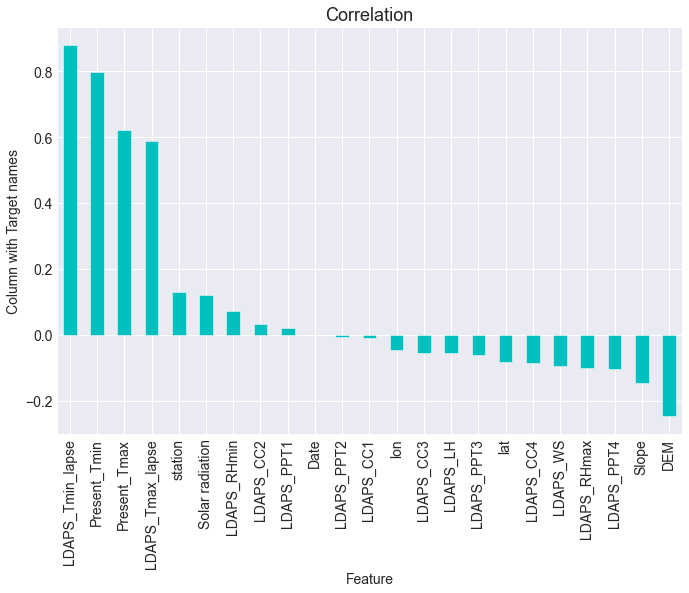

In [165]:
plt.figure(figsize=(10,7))
df2.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Column with Target names',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

In [166]:
df2.shape

(7752, 24)

In [168]:
v=df2[list(df2.columns)[23]] 
df2=df2.drop(['Next_Tmin'],axis=1) 
df2

,Date,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,12,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996
1,12,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500
2,12,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664
3,12,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844
4,12,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,301,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965
7748,301,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535
7749,301,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215
7750,0,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508


In [169]:
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [170]:
df2.shape

(7752, 23)

In [171]:
#calculates vif
def calc_vif(df2):
    vif=pd.DataFrame()
    vif['Variables']=df2.columns
    vif['VIF FACTOR']=[variance_inflation_factor(df2.values,i)for i in range(df2.shape[1])]
    return(vif)

In [172]:
calc_vif(df2)

,Variables,VIF FACTOR
0,Date,4.510293
1,station,5.071035
2,Present_Tmax,282.347556
3,Present_Tmin,288.750603
4,LDAPS_RHmin,93.648484
5,LDAPS_RHmax,317.564819
6,LDAPS_Tmax_lapse,708.591414
7,LDAPS_Tmin_lapse,732.360310
8,LDAPS_WS,15.099402
9,LDAPS_LH,6.663134


In [173]:
#drop columns which has multicollinearity and zero correlations

df2=df2.drop(['Date'],axis=1)

In [174]:
calc_vif(df2)

,Variables,VIF FACTOR
0,station,5.070681
1,Present_Tmax,282.276632
2,Present_Tmin,286.504520
3,LDAPS_RHmin,92.963311
4,LDAPS_RHmax,309.679318
5,LDAPS_Tmax_lapse,705.920159
6,LDAPS_Tmin_lapse,726.815455
7,LDAPS_WS,14.776245
8,LDAPS_LH,6.607589
9,LDAPS_CC1,10.461032


In [175]:
df2=df2.drop(['lon'],axis=1)

In [176]:
calc_vif(df2)

,Variables,VIF FACTOR
0,station,4.918967
1,Present_Tmax,282.248235
2,Present_Tmin,286.493243
3,LDAPS_RHmin,92.064474
4,LDAPS_RHmax,309.287413
5,LDAPS_Tmax_lapse,705.783962
6,LDAPS_Tmin_lapse,725.120058
7,LDAPS_WS,14.735021
8,LDAPS_LH,6.599190
9,LDAPS_CC1,10.441809


In [177]:
df2.shape

(7752, 21)

In [178]:
df2.insert(21,'Next_Tmin',v) 
df2

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,DEM,Slope,Solar radiation,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,212.3350,2.785000,5992.895996,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,44.7624,0.514100,5869.312500,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,33.3068,0.266100,5863.555664,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,45.7160,2.534800,5856.964844,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,35.0380,0.505500,5859.552246,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,15.5876,0.155400,4443.313965,18.1
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,17.2956,0.222300,4438.373535,18.8
7749,25.0,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,...,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,19.5844,0.271300,4451.345215,17.4
7750,1.0,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,12.3700,0.098475,4329.520508,11.3


In [179]:
df2.shape[1]

22

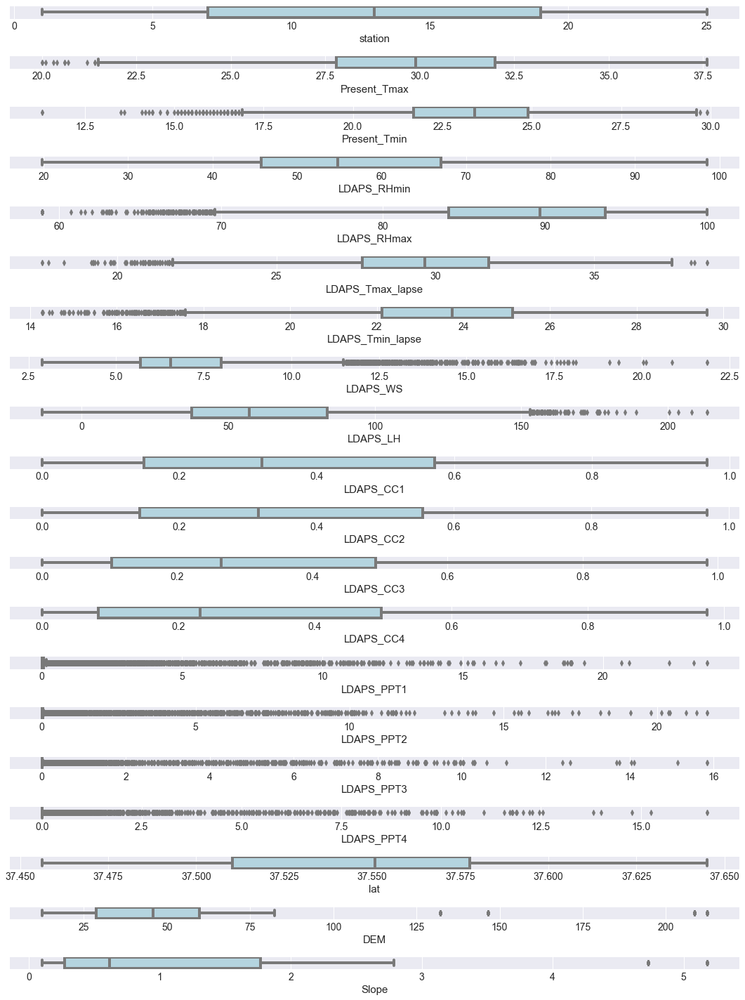

In [180]:
plt.figure(figsize= (15,20))
pltnum = 1
for i in df2:
    if pltnum <=20:
        plt.subplot(20,1,pltnum)
        sns.boxplot(df2[i],color = 'lightblue')
        plt.xlabel(i,fontsize=15)
    pltnum+=1
plt.tight_layout()

In [181]:
#ckeck skewness
df2.skew()

station             0.000100
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.202176
LDAPS_RHmax        -1.109283
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.581763
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmin          -0.404447
dtype: float64

In [182]:
#checking Z-score to remove outliers


import numpy as np
from scipy.stats import zscore
z=np.abs(zscore(df2))
z.shape

(7752, 22)

In [183]:
threshold=3
print(np.where(z>3))

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int64), array([ 7, 14, 14, ..., 14, 15, 16], dtype=int64))


In [184]:
df_new1=df2[(z<3).all(axis=1)]
print(df2.shape)
print(df_new1.shape)

(7752, 22)
(6851, 22)


some outliers got removed

In [186]:
#finds data loss
loss_percent=(7752-6851)/(7752*100)
print(loss_percent)

0.001162280701754386


data loss percentage is very low.data is cleaned also

In [188]:
df_new1

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,DEM,Slope,Solar radiation,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.130928,0.0,0.0,0.0,0.0,37.6046,212.3350,2.7850,5992.895996,21.2
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.127727,0.0,0.0,0.0,0.0,37.6046,44.7624,0.5141,5869.312500,22.5
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.142125,0.0,0.0,0.0,0.0,37.5776,33.3068,0.2661,5863.555664,23.9
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.134249,0.0,0.0,0.0,0.0,37.6450,45.7160,2.5348,5856.964844,24.3
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.170021,0.0,0.0,0.0,0.0,37.5507,35.0380,0.5055,5859.552246,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,...,0.004380,0.0,0.0,0.0,0.0,37.5507,26.2980,0.5721,4456.024414,17.7
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,...,0.017678,0.0,0.0,0.0,0.0,37.5102,21.9668,0.1332,4441.803711,17.1
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,...,0.000000,0.0,0.0,0.0,0.0,37.5372,15.5876,0.1554,4443.313965,18.1
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,...,0.000000,0.0,0.0,0.0,0.0,37.5237,17.2956,0.2223,4438.373535,18.8


In [189]:
df_new1.shape

(6851, 22)

In [190]:
#seggregate input data and output data
x=df_new1.iloc[:,:-1]
y=df_new1.iloc[:,-1]

In [191]:
#removing skewness using power transform
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[-1.8710793 , -0.47455795, -0.83585622, ...,  1.85444544,
         1.33236922,  1.88549812],
       [-1.65913322,  0.67463626, -0.753449  , ...,  0.07222941,
        -0.37204932,  1.42610319],
       [-1.46550793,  0.56147483, -0.02854085, ..., -0.35108794,
        -0.94253596,  1.40558868],
       ...,
       [ 1.30880106, -2.12655844, -2.45877768, ..., -1.57609075,
        -1.2785579 , -1.77931911],
       [ 1.42420342, -2.12655844, -2.24958457, ..., -1.39662327,
        -1.06802334, -1.7853709 ],
       [ 1.53838694, -2.1537793 , -2.3548891 , ..., -1.18693177,
        -0.92822683, -1.76942598]])

In [192]:
#scaling to get better model performance
from sklearn.preprocessing import MinMaxScaler
mmscaler = MinMaxScaler()
x = mmscaler.fit_transform(x)
x

array([[0.        , 0.3848071 , 0.32718084, ..., 1.        , 0.8691088 ,
        1.        ],
       [0.062164  , 0.58598814, 0.34094445, ..., 0.53617521, 0.34208278,
        0.87749697],
       [0.11895451, 0.56617779, 0.46201818, ..., 0.42600614, 0.16568167,
        0.87202653],
       ...,
       [0.93266222, 0.09560345, 0.05612146, ..., 0.10719705, 0.06177978,
        0.0227336 ],
       [0.96650985, 0.09560345, 0.09106077, ..., 0.15390377, 0.12687952,
        0.02111982],
       [1.        , 0.09083809, 0.07347287, ..., 0.20847635, 0.17010622,
        0.02537172]])

MODEL EVALUATION

REGRESSION :

Linear Regression

In [194]:
#Linear Regression
#model fitting
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split

In [195]:
#getting best accuracy with help of selecting random state
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=i)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    print(f"At random state {i},the training accuracy is:{r2_score(y_train,pred_train)*100}")
    print(f"At random state {i},the testing accuracy is:{r2_score(y_test,pred_test)*100}")
    print("\n")
    
    
 

At random state 0,the training accuracy is:81.62935942038825
At random state 0,the testing accuracy is:82.49442699680709


At random state 1,the training accuracy is:82.03285343024986
At random state 1,the testing accuracy is:80.86832441106885


At random state 2,the training accuracy is:81.9839694824018
At random state 2,the testing accuracy is:81.04633302761344


At random state 3,the training accuracy is:81.91936687055656
At random state 3,the testing accuracy is:81.26321864849457


At random state 4,the training accuracy is:82.19738685906977
At random state 4,the testing accuracy is:80.14767961069552


At random state 5,the training accuracy is:82.08164764782498
At random state 5,the testing accuracy is:80.6533622139284


At random state 6,the training accuracy is:82.01678348369596
At random state 6,the testing accuracy is:80.8823763963582


At random state 7,the training accuracy is:81.6381250765335
At random state 7,the testing accuracy is:82.46516809240242


At random state 8,th

In [196]:
#evaluation metrics

print("Accuracy:", r2_score(y_test,pred_test)*100)

Accuracy: 82.1752182865025


In [197]:
#cross validation at random state
Train_accuracy=(r2_score(y_train,pred_train)*100)
Test_accuracy=r2_score(y_test,pred_test)*100
from sklearn.model_selection import cross_val_score
for j in range(2,10):
    cv_score=cross_val_score(lr,x,y,cv=j)
    cv_mean=cv_score.mean()*100
    print(f"At cross fold {j} the cv score is {cv_mean} and accuracy score for Training is {Train_accuracy} and accuracy score for Testing is {Test_accuracy}")
    print("\n")
    

At cross fold 2 the cv score is 79.742998882717 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 3 the cv score is 76.9348001807377 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 4 the cv score is 77.88491103646811 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 5 the cv score is 76.95098742955017 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 6 the cv score is 74.64730003059184 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 7 the cv score is 75.24075184516855 and accuracy score for Training is 81.72313056457136 and accuracy score for Testing is 82.1752182865025


At cross fold 8 the cv score is 76.66895832340039 and accuracy scor

parameter tuning

In [198]:
#perform gridsearchcv and cross val score on LinearRegression
from sklearn.model_selection import GridSearchCV

parameters={ 'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True,False], 'n_jobs':[None,1,-1], 'positive':[True,False]}
lr=LinearRegression()
clf=GridSearchCV(lr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': True, 'positive': False}


In [199]:
lr=LinearRegression(copy_X= True, fit_intercept= True, n_jobs= None, normalize= True, positive= False)
lr.fit(x_train,y_train)
pred_test_lr=lr.predict(x_test)
pred_train_lr=lr.predict(x_train)
lr_score = lr.score(x_train,y_train)
lr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",lr_acc_score*100)
print("score of model is:",lr_score*100)

Accuracy score is: 82.1752182865025
score of model is: 81.72313056457136


cv_mean is: 76.95098742955018


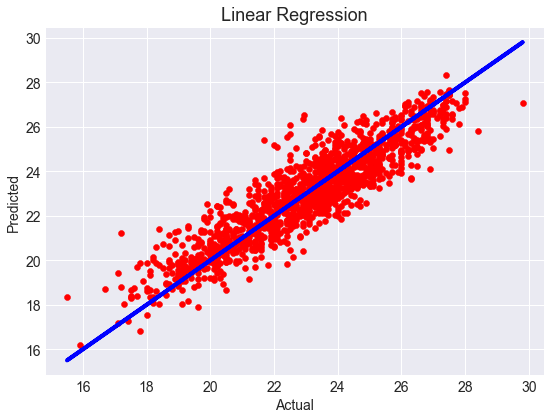

In [200]:
cv_score_lr=cross_val_score(lr,x,y,cv=5)
cv_mean_lr=cv_score_lr.mean()
print("cv_mean is:",cv_mean_lr*100)

plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

In [201]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test))
print("mean squared error",mean_squared_error(y_test,pred_test))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test)))
print("r2_score is",r2_score(y_test,pred_test)*100)

mean absolute error 0.7667835112541186
mean squared error 0.963075950828486
Root mean squared error 0.98136433134106
r2_score is 82.1752182865025


LASSO REGRESSION

parameter tuning

In [203]:
#perform gridsearchcv and cross val score on lasso regression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import Lasso
parameters={'alpha':[0.0001,0.001,0.01,0.1,1,10],'random_state':list(range(0,10)),'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001]}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [204]:
ls=Lasso(alpha=1,random_state=0,fit_intercept= True, normalize= False,tol= 0.001)
ls.fit(x_train,y_train)
pred_test_ls=ls.predict(x_test)
pred_train_ls=ls.predict(x_train)
ls_score = ls.score(x_train,y_train)
ls_acc_score=r2_score(y_test,pred_test_ls)
print("Accuracy score is:",ls_acc_score*100)

Accuracy score is: -0.0033975103415961883


In [205]:
#checks cv score
for u in range(2,10):
    cv_score_ls=cross_val_score(ls,x,y,cv=5)
    cv_mean_ls=cv_score_ls.mean()
    print("At cv :-",j )
    print("cv_score is:",cv_mean_ls*100)
    print("accuracy score---r2_score is",ls_acc_score*100)

At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883
At cv :- 9
cv_score is: -14.745061401987893
accuracy score---r2_score is -0.0033975103415961883


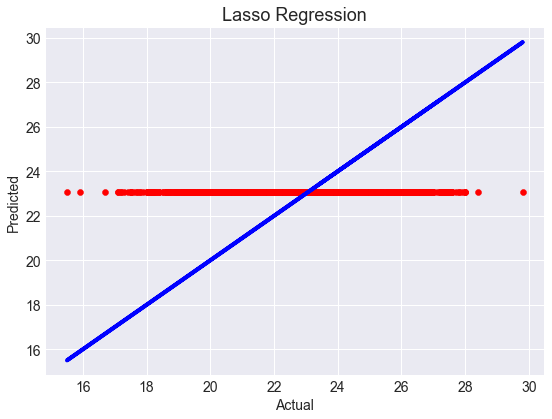

In [206]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_ls,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

In [207]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_ls))
print("mean squared error",mean_squared_error(y_test,pred_test_ls))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_ls)))
print("r2_score is",r2_score(y_test,pred_test_ls)*100)

mean absolute error 1.8808521631771493
mean squared error 5.403200369652862
Root mean squared error 2.3244785156358967
r2_score is -0.0033975103415961883


RANDOM FOREST REGRESSION

parameter tuning

In [208]:
#perform gridsearchcv and cross val score on RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
parameters={'criterion':['friedman_mse','mae'],'max_features':["auto","sqrt","log2"],'bootstrap': [True, False],'min_samples_split':[1,2],'min_samples_leaf':[1,2]}
rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

  

{'bootstrap': False, 'criterion': 'friedman_mse', 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}


In [209]:
                                                    


rf=RandomForestRegressor(criterion="mae",max_features="log2",bootstrap= True,min_samples_leaf= 2, min_samples_split= 2)
rf.fit(x_train,y_train)
pred_test_rf=rf.predict(x_test)
pred_train_rf=rf.predict(x_train)
rf_score = rf.score(x_train,y_train)
rf_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",rf_acc_score*100)
print("score of model is:",rf_score*100)

Accuracy score is: 82.1752182865025
score of model is: 96.37603641337282


In [211]:
cv_score_rf=cross_val_score(rf,x,y,cv=5)
cv_mean_rf=cv_score_rf.mean()
print("cv_mean is:",cv_mean_rf*100)

cv_mean is: 77.02818725059603


In [210]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rf))
print("mean squared error",mean_squared_error(y_test,pred_test_rf))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rf)))
print("r2_score is",r2_score(y_test,pred_test_rf)*100)

cv_mean is: 76.84945086836935
mean absolute error 0.582474313507491
mean squared error 0.5548865549657243
Root mean squared error 0.7449070780746577
r2_score is 89.73006053207936


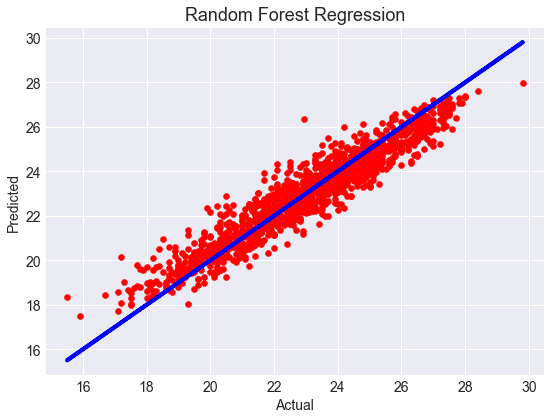

In [212]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rf,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Random Forest Regression',fontsize=18)
plt.show()

RIDGE REGRESSION

In [213]:
#perform gridsearchcv and cross val score on Ridge Regressor
from sklearn.linear_model import Ridge
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
rd=Ridge()
clf=GridSearchCV(rd,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.001, 'fit_intercept': True, 'normalize': True, 'random_state': 0, 'tol': 0.001}


In [214]:
rd=Ridge(alpha=0.001,fit_intercept=True,normalize=True,random_state=0,tol=0.001)
rd.fit(x_train,y_train)
pred_test_rd=rd.predict(x_test)
pred_train_rd=rd.predict(x_train)
rd_score = rd.score(x_train,y_train)
rd_acc_score=r2_score(y_test,pred_test_rd)
print("Accuracy score is:",rd_acc_score*100)
print("score of model is:",rd_score*100)

Accuracy score is: 82.17434032705245
score of model is: 81.72305206569524


In [216]:
cv_score_rd=cross_val_score(rd,x,y,cv=5)
cv_mean_rd=cv_score_rd.mean()
print("cv_mean is:",cv_mean_rd*100)

cv_mean is: 76.95715952411655


In [215]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_rd))
print("mean squared error",mean_squared_error(y_test,pred_test_rd))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_rd)))
print("r2_score is",r2_score(y_test,pred_test_rd)*100)

cv_mean is: 76.95715952411655
mean absolute error 0.7667793781098529
mean squared error 0.9631233871250837
Root mean squared error 0.9813884995887632
r2_score is 82.17434032705245


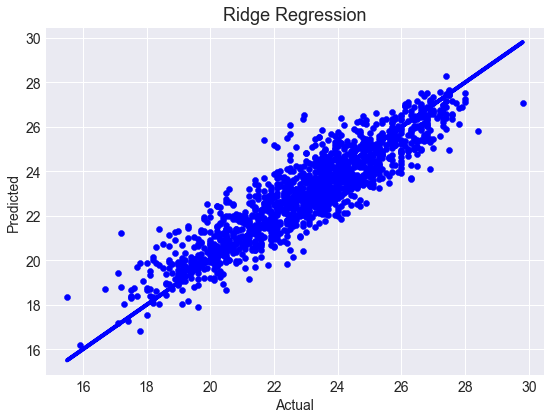

In [217]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_rd,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

DECISION TREE REGRESSOR

In [218]:
#perform gridsearchcv and cross val score on Decison Tree Regressor
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
parameters={'criterion':['mse','friedman_mse','mae','poisson'],'splitter':['best','random'],'max_features':['auto', 'sqrt', 'log2'],'random_state':list(range(0,10)),'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
dt=DecisionTreeRegressor()
clf=GridSearchCV(dt,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'criterion': 'mae', 'max_features': 'auto', 'min_weight_fraction_leaf': 0.1, 'random_state': 0, 'splitter': 'best'}


In [219]:
                  

dt=DecisionTreeRegressor(criterion='mse',max_features= 'auto', min_weight_fraction_leaf= 0.1, random_state= 1, splitter= 'random')
dt.fit(x_train,y_train)
pred_test_dt=dt.predict(x_test)
pred_train_dt=dt.predict(x_train)
dt_score = dt.score(x_train,y_train)
dt_acc_score=r2_score(y_test,pred_test_dt)
print("Accuracy score is:",dt_acc_score*100)
print("score of model is:",dt_score*100)

Accuracy score is: 61.633652367744126
score of model is: 62.53945832664305


In [220]:
cv_score_dt=cross_val_score(dt,x,y,cv=5)
cv_mean_dt=cv_score_dt.mean()
print("cv_mean is:",cv_mean_dt*100)

cv_mean is: 53.023349556888256


In [221]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_dt))
print("mean squared error",mean_squared_error(y_test,pred_test_dt))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_dt)))
print("r2_score is",r2_score(y_test,pred_test_dt)*100)

mean absolute error 1.1322748961372553
mean squared error 2.072940208730385
Root mean squared error 1.439770887582599
r2_score is 61.633652367744126


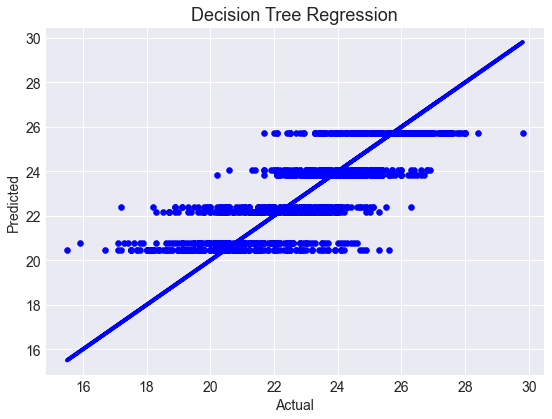

In [222]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_dt,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

GRADIENT BOOSTING REGRESSOR

In [223]:
#perform gridsearchcv and cross val score on  GradientBoostingRegressor
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters={'loss':['ls','lad','huber','quantile'],'n_estimators':[50,100],'criterion':['friedman_mse','mse'],'learning_rate':[0.05],'max_depth' : [1,3,5,7,9,11,12],'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]}
gbr=GradientBoostingRegressor()
clf=GridSearchCV(gbr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'criterion': 'friedman_mse', 'learning_rate': 0.05, 'loss': 'ls', 'max_depth': 7, 'min_weight_fraction_leaf': 0.1, 'n_estimators': 100}


In [224]:
gbr=GradientBoostingRegressor(criterion='friedman_mse',loss='huber',n_estimators=100,learning_rate= 0.05,max_depth= 5, min_weight_fraction_leaf= 0.1)
gbr.fit(x_train,y_train)
pred_test_gbr=gbr.predict(x_test)
pred_train_gbr=gbr.predict(x_train)
gbr_score = gbr.score(x_train,y_train)
gbr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",gbr_acc_score*100)
print("score of model is:",gbr_score*100)

Accuracy score is: 82.1752182865025
score of model is: 84.37622403066815


In [226]:
cv_score_gbr=cross_val_score(gbr,x,y,cv=5)
cv_mean_gbr=cv_score_gbr.mean()
print("cv_mean is:",cv_mean_gbr*100)

cv_mean is: 77.02983232433743


In [225]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_gbr))
print("mean squared error",mean_squared_error(y_test,pred_test_gbr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_gbr)))
print("r2_score is",r2_score(y_test,pred_test_gbr)*100)

cv_mean is: 77.02983232433743
mean absolute error 0.7221378901889892
mean squared error 0.8700202890763549
Root mean squared error 0.9327487813320127
r2_score is 83.8975090949376


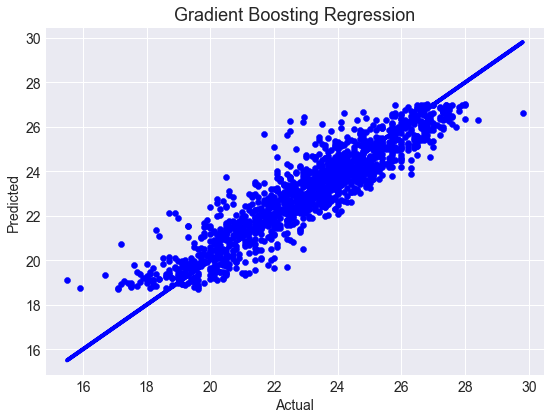

In [227]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_gbr,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Gradient Boosting Regression',fontsize=18)
plt.show()

SUPPORT VECTOR REGRESSOR

In [229]:
#perform gridsearchcv and cross val score on Support Vector Regressor
from sklearn.svm import SVR
parameters ={'kernel':['linear','rbf'],'gamma':['scale', 'auto'],'tol':[0.0001,0.001],'shrinking':[True,False],'degree':[3,4],'max_iter':[1,-1]}
sv=SVR()
clf=GridSearchCV(sv,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': False, 'tol': 0.001}


In [234]:
sv=SVR(kernel='rbf',gamma='scale',degree= 3, max_iter= -1, shrinking= False, tol= 0.001)
sv.fit(x_train,y_train)
pred_test_sv=sv.predict(x_test)
pred_train_sv=sv.predict(x_train)
sv_score = sv.score(x_train,y_train)
sv_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",sv_acc_score*100)
print("score of model is:",sv_score*100)

Accuracy score is: 82.1752182865025
score of model is: 89.91802476179905


In [235]:
cv_score_sv=cross_val_score(sv,x,y,cv=5)
cv_mean_sv=cv_score_sv.mean()
print("cv_mean is:",cv_mean_sv*100)

cv_mean is: 74.0642820933149


In [236]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_sv))
print("mean squared error",mean_squared_error(y_test,pred_test_sv))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_sv)))
print("r2_score is",r2_score(y_test,pred_test_sv)*100)

mean absolute error 0.6223789743803153
mean squared error 0.6550394178263318
Root mean squared error 0.8093450548599972
r2_score is 87.87641345789329


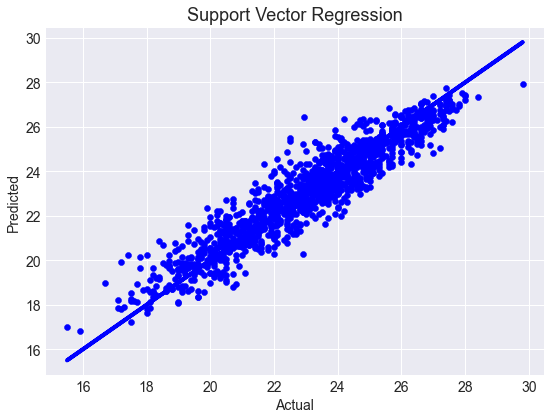

In [237]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_sv,color='b')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Support Vector Regression',fontsize=18)
plt.show()

ELASTIC NET REGRESSION(COMBINATION OF L1 AND L2)

In [238]:
from sklearn.linear_model import ElasticNet
parameters={'alpha':[0.0001,0.001,0.01,0.1,1],'fit_intercept':[True,False],'normalize':[True,False],'tol':[0.001],'random_state':list(range(0,10))}
enr=ElasticNet()
clf=GridSearchCV(enr,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'fit_intercept': True, 'normalize': False, 'random_state': 0, 'tol': 0.001}


In [239]:
enr=ElasticNet(alpha=0.0001,fit_intercept= True,normalize= False, random_state= 0, tol= 0.001)
enr.fit(x_train,y_train)
pred_test_enr=enr.predict(x_test)
pred_train_enr=enr.predict(x_train)
enr_score = enr.score(x_train,y_train)
enr_acc_score=r2_score(y_test,pred_test)
print("Accuracy score is:",enr_acc_score*100)
print("score of model is:",enr_score*100)

Accuracy score is: 82.1752182865025
score of model is: 81.72285015981839


In [240]:
cv_score_enr=cross_val_score(enr,x,y,cv=5)
cv_mean_enr=cv_score_enr.mean()
print("cv_mean is:",cv_mean_enr*100)

cv_mean is: 76.96305071060878


In [241]:
#evaluation metrics
print("mean absolute error",mean_absolute_error(y_test,pred_test_enr))
print("mean squared error",mean_squared_error(y_test,pred_test_enr))
print("Root mean squared error",np.sqrt(mean_squared_error(y_test,pred_test_enr)))
print("r2_score is",r2_score(y_test,pred_test_enr)*100)

mean absolute error 0.7667653581893746
mean squared error 0.9631068837141715
Root mean squared error 0.9813800913581707
r2_score is 82.17464577512929


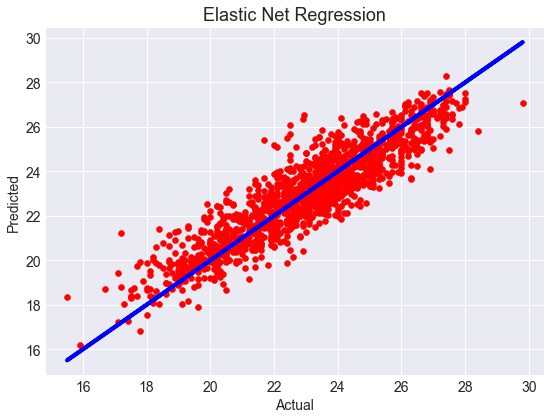

In [242]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test_enr,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel('Actual',fontsize=14)
plt.ylabel('Predicted',fontsize=14)
plt.title('Elastic Net Regression',fontsize=18)
plt.show()

CONCLUSION

OUTPUT
 

In [250]:
import numpy as np
a=np.array(y_test)
predicted=np.array(lr.predict(x_test))
df_con=pd.DataFrame({"Original":a,"Predicted":predicted},index=range(len(a)))
df_con

,Original,Predicted
0,27.2,27.584873
1,25.3,23.245767
2,23.9,24.541415
3,25.1,23.319031
4,21.2,21.583874
...,...,...
1366,23.1,23.810826
1367,23.4,23.266286
1368,18.2,18.352585
1369,20.6,22.623017


In [251]:
import pickle
filename='Temperature_Forecast_lr.pkl'
pickle.dump(lr,open(filename,'wb'))

In [243]:
models=['Linear Regression','Lasso regression','RandomForestRegressor','Ridge Regressor','Decison Tree Regressor','GradientBoostingRegressor'
,'Support Vector Regressor','ElasticNet Regression']
        

In [247]:
scores=[ lr_acc_score*100,ls_acc_score*100,rf_acc_score*100,rd_acc_score*100,dt_acc_score*100,gbr_acc_score*100,sv_acc_score*100,enr_acc_score*100]
scores

[82.1752182865025,
 -0.0033975103415961883,
 82.1752182865025,
 82.17434032705245,
 61.633652367744126,
 82.1752182865025,
 82.1752182865025,
 82.1752182865025]

In [248]:
Nos=[]
for i in range(1,len(models)+1):
    Nos.append(i)
Nos    

[1, 2, 3, 4, 5, 6, 7, 8]

In [249]:
import pandas as pd
Model_scores=pd.DataFrame({})
Model_scores['Nos']=Nos
Model_scores['Model Names']=models
Model_scores['Scores']=scores
Model_scores.sort_values(by='Scores', ascending=False).style.hide_index()

Nos,Model Names,Scores
1,Linear Regression,82.175218
3,RandomForestRegressor,82.175218
6,GradientBoostingRegressor,82.175218
7,Support Vector Regressor,82.175218
8,ElasticNet Regression,82.175218
4,Ridge Regressor,82.174340
5,Decison Tree Regressor,61.633652
2,Lasso regression,-0.003398


CONCLUSION

From the above models,Linear Regression performs well.

Because,Linear models are often useful approximations to nonlinear relationships as long as we restrict our attention to realistic and relatively modest variations in the variables. ... If variables are related to each other by a power function, then there is a log-linear relationship between them.

So,We save this model for our prediction.

So we can predict the Next day minimum temperature by using mainly Present_Tmax, Present_Tmin, LDAPS_Tmax_lapse, LDAPS_Tmin_lapse,DEM and other factors 

In [253]:
df_con.to_csv("Temperature_Forecast_lr.csv",sep='\t')